In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb
import os, glob, warnings
import re
import tarfile
from ipywidgets import Image
from IPython.display import display, Image
from astropy.stats import sigma_clip
from colorama import Fore
import matplotlib.cm as cm
from astropy.cosmology import FlatLambdaCDM
import astropy.units as u
from astropy.table import Table
from scipy import stats

warnings.filterwarnings("ignore")
sb.set(style="ticks", color_codes=True, context="notebook", font_scale=1.4)
sb.set_style({"xtick.direction": "in","ytick.direction": "in"})

mainpath = '/Users/jorgetil/Astro/HITS'

## Some functions

In [2]:
def preprocess_lc(lc, min_mag=15., mag_key=None):
    # time, mag, error = np.array(lc_g['MJD'].quantity), \
    #                   np.array(lc_g['MAG_KRON'].quantity),\
    #                   np.array(lc_g['MAGERR_KRON'].quantity)
    # remove saturated points
    print 'Original size: %i |' % len(lc),
    if mag_key:
        lc = lc[lc[mag_key] >= min_mag]
        filtered_data = sigma_clip(lc[mag_key], sigma=3,
                                   iters=2, cenfunc=np.median,
                                   copy=False)
    else:
        lc = lc[lc[:,1] >= min_mag]
        filtered_data = sigma_clip(lc[:,1], sigma=4,
                                   iters=1, cenfunc=np.median,
                                   copy=False)
    lc = lc[~filtered_data.mask]
    print ' clipped: %i |' % np.sum(filtered_data.mask),
    print 'Final size: %i' % len(lc)

    return lc

In [3]:
def give_me_lc(field, CCD, X, Y, extract=False):
    year = field[:-3]
    if True:
        tar = tarfile.open("%s/lightcurves/%s/%s/%s_%s_LC_occ15.tar.gz" 
                           % (mainpath, field, CCD, field, CCD))
        fil = tar.extractfile('%s_%s_%s_%s_g.dat' % (field, CCD, X, Y))
        if extract:
            tar.extract('%s_%s_%s_%s_g.dat' % (field, CCD, X, Y),
                    path='/Users/jorgetil/Astro/HITS/lightcurves/samples/.')
    #except:
    #    print 'No tar file or element in tar file'
    #    return None
    
    time, mag, err, epoch = [], [], [], []
    for line in fil:
        if line[0] == '#': continue
        values = line.split()
        epoch.append(float(values[0]))
        time.append(float(values[1]))
        mag.append(float(values[2]))
        err.append(float(values[3]))
    #lc = preprocess_lc(np.array([time, mag, err]).T)
    lc = np.array([time, mag, err]).T
    time = lc[:,0]
    mag= lc[:,1]
    err = lc[:,2]
    
    return time, mag, err

In [4]:
def give_me_errordist_stars(mag, n=10):
    bins = np.arange(16, 25.1, 0.25)
    pos = 0
    for k, a in enumerate(bins):
        if mag >= a:
            pos = k
        else:
            break
    file_path = '%s/tables/ErrDist/%s_errDist_%.2f_%.2f.pkl' % (mainpath, year, bins[pos], bins[pos+1])
    dist = np.load(file_path)
    dist = dist[dist < np.percentile(dist, 70)]
    return np.random.choice(dist, n)

def give_me_errordist_gal(mag, n=10):
    bins = np.arange(16, 25.1, 0.5)
    pos = 0
    for k, a in enumerate(bins):
        if mag >= a:
            pos = k
        else:
            break
    file_path = '%s/tables/ErrDist/%s_errDist_gal_%.2f_%.2f.pkl' % (mainpath, year, bins[pos], bins[pos+1])
    dist = np.load(file_path)
    dist = dist[dist < np.percentile(dist, 70)]
    return np.random.choice(dist, n) * .5

#give_me_errordist_gal(18.34, 5)

In [5]:
def plots_lc(idx, cat=True, psf=True, zp=0.):
    field, ccd, col_pix, row_pix = re.findall(r'(\w+\d+\w?\_\d\d?)\_(\w\d+?)\_(\d+)\_(\d+)', idx)[0]
    if psf:
        data_file = '%s/lightcurves/galaxy/%s/%s_%s_%s_%s_g_psf_ff.csv' % \
                    (mainpath, field, field, ccd, col_pix, row_pix)
    if cat:
        time, mag_cat, err_cat = give_me_lc(field, ccd, col_pix, row_pix)
        zp = np.median(mag_cat)
    if os.path.exists(data_file):
        data = pd.read_csv(data_file, skiprows=5)
        mjd = data['mjd']
        mag0 = data['aperture_mag_0'] - np.median(data['aperture_mag_0']) + zp
        mag1 = data['aperture_mag_1'] - np.median(data['aperture_mag_1']) + zp
        mag2 = data['aperture_mag_2'] - np.median(data['aperture_mag_2']) + zp
        e_mag0 = data['aperture_mag_err_0']
        e_mag1 = data['aperture_mag_err_1']
        e_mag2 = data['aperture_mag_err_2']
        
        star_lims = True
        gal_lims= True
        try:
            err_stars = give_me_errordist_stars(np.median(mag0), n=len(mjd))
        except IOError:
            star_lims = False
        try:
            err_gal = give_me_errordist_gal(np.median(mag0), n=len(mjd))
        except IOError:
            gal_lims= False
        
        radii = np.array(open(data_file, "r").readlines()[4].split()[5:9], dtype=float)
        fig, ax = plt.subplots(nrows=1, figsize=(12,4.5), sharex=True)
        
        #ax.errorbar(mjd, mag0, yerr=e_mag0, fmt='.', color='g', 
        #            label='R=%.4f arcsec' % (radii[0]*0.27), markersize=7)
        ax.errorbar(mjd, mag1, yerr=e_mag0, fmt='o', color='b',
                    label='R=%.4f arcsec' % (radii[1]*0.27), markersize=7)
        #ax.errorbar(mjd, mag2, yerr=e_mag0, fmt='.', color='r', 
        #            label='R=%.4f arcsec' % (radii[2]*0.27), markersize=7)
        print star_lims, 
        if star_lims:
            ax.plot(mjd, np.median(mag1) + 2 * err_stars, ls=':', c='darkgreen', alpha=.5, label='2*rms(NV Stars)')
            ax.plot(mjd, np.median(mag1) - 2 * err_stars, ls=':', c='darkgreen', alpha=.5, label='_nolegend_')
            ax.plot(mjd, np.median(mag1) + 3 * err_stars, ls='--', c='darkgreen', alpha=.5, label='3*rms(NV Stars)')
            ax.plot(mjd, np.median(mag1) - 3 * err_stars, ls='--', c='darkgreen', alpha=.5, label='_nolegend_')
        if gal_lims:
            ax.plot(mjd, np.median(mag1) + 2 * err_gal, ls=':', c='darkred', alpha=.5, label='2*rms(NV Galax)')
            ax.plot(mjd, np.median(mag1) - 2 * err_gal, ls=':', c='darkred', alpha=.5, label='_nolegend_')
            ax.plot(mjd, np.median(mag1) + 3 * err_gal, ls='--', c='darkred', alpha=.5, label='3*rms(NV Galax)')
            ax.plot(mjd, np.median(mag1) - 3 * err_gal, ls='--', c='darkred', alpha=.5, label='_nolegend_')
        
        if True:
            ax.fill_between(mjd, np.median(mag1) - 2 * e_mag0, np.median(mag1) + 2 * e_mag0,
                            facecolor='gray', alpha=.1, label='2*error')
            ax.fill_between(mjd, np.median(mag1) - 3 * e_mag0, np.median(mag1) + 3 * e_mag0,
                            facecolor='gray', alpha=.1, label='3*error')
            
        ax.set_xlabel('mjd')
        ax.set_ylabel('g mag')
        ax.legend(loc='best', bbox_to_anchor=(1., 0.6),  shadow=False)
        ax.set_xlim([mjd.min() - .1, mjd.max() + .1])
        ax.invert_yaxis()
        plt.show()
        PATH = '%s/lightcurves/galaxy/%s/%s_%s_%s_%s_g_psf_series_ff.png' % \
               (mainpath, field, field, ccd, col_pix, row_pix)
        if not os.path.exists(PATH):
            return
        ima = Image(filename=PATH, retina=True)
        display(ima)
    else:
        print 'file does not exist, next...'
        print '----------------------'
        return

In [6]:
ap = 0.75
ano = 15
year = 'Blind%sA' % (ano)
print year

Blind15A


# Main analysis

In [7]:
# loading data
aux = pd.read_csv('%s/tables/galaxy/%s_feat_SDSS_galaxy_psf_ap%sseeing.csv.gz'
                  % (mainpath, year, ap), compression='gzip')
aux.set_index('internalID', inplace=True)
#aux['ExcessVariance_cor'] = aux['ExcessVariance'] - aux['ExcessVariance_e']
feat_tables = aux
print 'Shape of original feature table: ', feat_tables.shape

Shape of original feature table:  (7592, 89)


In [8]:
print float(feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25').shape[0])/len(feat_tables)*100.
print float(feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001').shape[0])/len(feat_tables)*100.
print float(feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001 and Amplitude < 0.2').shape[0])/len(feat_tables)*100.
print float(feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001 and Amplitude < 0.2 and MedianErr < 0.015').shape[0])/len(feat_tables)*100
print float(feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001 and Amplitude < 0.2 and MedianErr < 0.015 and MedianAbsDev > 0.015').shape[0])#/len(feat_tables)*100
print feat_tables.query('zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001 and Amplitude < 0.2 and MedianErr < 0.015 and MedianAbsDev > 0.015 and spType != "LRG"').shape[0]
            

99.4336143309
17.8213909378
16.1880927292
5.37407797682
258.0
249


In [12]:
print feat_tables.spType.value_counts()
print feat_tables.spCl.value_counts()
print feat_tables.subClass.value_counts()

LRG                    4485
GALAXY                 2764
QSO                     177
QA                       85
SERENDIPITY_FIRST        24
ROSAT_D                  11
XMMHR                     9
CHANDRAv1                 6
BRIGHTGAL                 5
NONLEGACY                 4
SERENDIPITY_BLUE          4
SDSSFILLER                3
XMMRED                    3
GAL_NEAR_QSO              3
SERENDIPITY_DISTANT       2
BLUE_RADIO                2
REDDEN_STD                1
XMMGRIZ                   1
SPECTROPHOTO_STD          1
GES                       1
Name: spType, dtype: int64
GALAXY    7589
QSO          2
Name: spCl, dtype: int64
STARFORMING              830
STARBURST                216
AGN                      104
BROADLINE                 57
AGN BROADLINE             22
STARFORMING BROADLINE      3
STARBURST BROADLINE        2
Name: subClass, dtype: int64


In [9]:
# getting distance and absolute magnitudes using astropy.cosmology library
# with a Flat Lambda CDM universe
cosmo = FlatLambdaCDM(H0=70 * u.km / u.s / u.Mpc, 
                      Tcmb0=2.725 * u.K, 
                      Om0=0.3089,
                      Ob0=0.0486)
print cosmo
lum_dist = cosmo.luminosity_distance(feat_tables.zsp)
# absolute mag of the galaxy from SDSS DR9
abs_mag = feat_tables.gmag + 5 - 5 * np.log10(lum_dist.to(u.pc).value)
k_g = (3.070 * (feat_tables.gmag - feat_tables.rmag) + 0.727)*feat_tables.zsp + (-0.313 * (feat_tables.gmag - feat_tables.rmag) + -0.173)
abs_mag_kcorr = feat_tables.gmag + 5 - 5*np.log10(lum_dist.to(u.pc).value) - k_g

feat_tables['gMag'] = abs_mag
feat_tables['gMag_k'] = abs_mag_kcorr
feat_tables['Lum_d'] = lum_dist

FlatLambdaCDM(H0=70 km / (Mpc s), Om0=0.309, Tcmb0=2.725 K, Neff=3.04, m_nu=[ 0.  0.  0.] eV, Ob0=0.0486)


In [14]:
print feat_tables.query('spType == "QSO"').zsp.max()

0.99669


In [15]:
# Value counts of classes and subclasses from SDSS DR9
print feat_tables.spType.value_counts()#/float(len(feat_tables))*100
print '________________________________'
print feat_tables.spCl.value_counts()
print '________________________________'
print feat_tables.subClass.value_counts()#/float(len(feat_tables))*100
print '________________________________'
print feat_tables.GZ_morph.value_counts()#/float(len(feat_tables.query('GZ_morph != "ND"')))

LRG                    4485
GALAXY                 2764
QSO                     177
QA                       85
SERENDIPITY_FIRST        24
ROSAT_D                  11
XMMHR                     9
CHANDRAv1                 6
BRIGHTGAL                 5
NONLEGACY                 4
SERENDIPITY_BLUE          4
SDSSFILLER                3
XMMRED                    3
GAL_NEAR_QSO              3
SERENDIPITY_DISTANT       2
BLUE_RADIO                2
REDDEN_STD                1
XMMGRIZ                   1
SPECTROPHOTO_STD          1
GES                       1
Name: spType, dtype: int64
________________________________
GALAXY    7589
QSO          2
Name: spCl, dtype: int64
________________________________
STARFORMING              830
STARBURST                216
AGN                      104
BROADLINE                 57
AGN BROADLINE             22
STARFORMING BROADLINE      3
STARBURST BROADLINE        2
Name: subClass, dtype: int64
________________________________
ND           5145
uncertain

In [16]:
# cleaning by quality and by positive excess variance corrected by its error
aux = feat_tables.query('MedianErr < .1 and Amplitude < .9 and '+
                        'Std < .5 and ExcessVariance_cor > 0')
print '\t| Shape of clean feature table: ', aux.shape,
print 
clean_feat_table = aux
#break

	| Shape of clean feature table:  (4299, 91)


In [17]:
# defining some interesting features keys to analyse
feat_to_hist = ['Amplitude', 'Beyond1Std',
                'ExcessVariance_cor', 'LinearTrend',
                'MaxSlope', 'Meanvariance', 'MedianErr',
                'MedianAbsDev', 'PercentAmplitude', 'Nout2sigma',
                'RatioMaxMinFlux', 'Std', 'StdToErr', 'ChiSqProb']

id_x_IMBH_paper = {}
# internal ID in HiTS database of IMBHs x-matched with papers
id_x_IMBH_paper[15] = ['Blind15A_25_S9_0091_3884', 'Blind15A_24_S9_0534_1578',
                       'Blind15A_06_S28_1763_0582', 'Blind15A_34_N7_1583_2928',
                       'Blind15A_34_S15_0058_3864','Blind15A_36_N24_1954_2573',
                       'Blind15A_47_N11_1859_2158']
id_x_IMBH_paper[14] = ['Blind14A_29_N25_1209_1367', 'Blind14A_35_S15_0903_2813',
                       'Blind14A_37_N28_1841_0819', 'Blind14A_06_N7_1537_2916',
                       'Blind14A_19_N11_1788_2145', 'Blind14A_29_S3_1446_1584',
                       'Blind14A_30_N2_1567_1422', 'Blind14A_36_S11_0999_1078']

print id_x_IMBH_paper

{14: ['Blind14A_29_N25_1209_1367', 'Blind14A_35_S15_0903_2813', 'Blind14A_37_N28_1841_0819', 'Blind14A_06_N7_1537_2916', 'Blind14A_19_N11_1788_2145', 'Blind14A_29_S3_1446_1584', 'Blind14A_30_N2_1567_1422', 'Blind14A_36_S11_0999_1078'], 15: ['Blind15A_25_S9_0091_3884', 'Blind15A_24_S9_0534_1578', 'Blind15A_06_S28_1763_0582', 'Blind15A_34_N7_1583_2928', 'Blind15A_34_S15_0058_3864', 'Blind15A_36_N24_1954_2573', 'Blind15A_47_N11_1859_2158']}


In [18]:
clean_feat_table.columns

Index([u'raMedian', u'decMedian', u'Amplitude', u'AndersonDarling',
       u'Autocor_length', u'Beyond1Std', u'CAR_mean', u'CAR_sigma', u'CAR_tau',
       u'ChiSqProb', u'Con', u'Eta_e', u'ExcessVariance', u'ExcessVariance_e',
       u'ExcessVariance_cor', u'FluxPercentileRatioMid20',
       u'FluxPercentileRatioMid35', u'FluxPercentileRatioMid50',
       u'FluxPercentileRatioMid65', u'FluxPercentileRatioMid80', u'Gskew',
       u'LinearTrend', u'MaxSlope', u'Mean', u'Meanvariance', u'MedianAbsDev',
       u'MedianBRP', u'MedianErr', u'Nout2sigma', u'PairSlopeTrend',
       u'PercentAmplitude', u'PercentDifferenceFluxPercentile', u'PeriodLS',
       u'Period_fit', u'Psi_CS', u'Psi_eta', u'Q31', u'RatioMaxMinFlux',
       u'Rcs', u'Skew', u'SlottedA_length', u'SmallKurtosis', u'Std',
       u'StdToErr', u'StetsonK', u'StetsonK_AC', u'RAdeg', u'DEdeg',
       u'errHalfMaj', u'errHalfMin', u'errPosAng', u'objID', u'mode',
       u'q_mode', u'class', u'SDSS12', u'm_SDSS12', u'flags', u'Obs

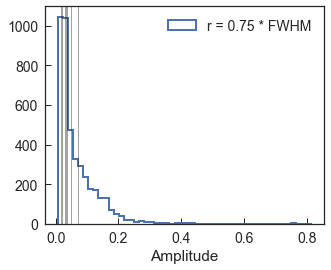

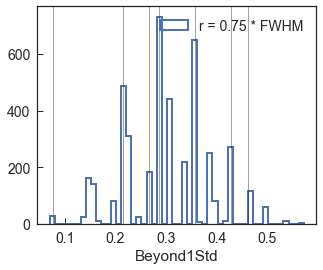

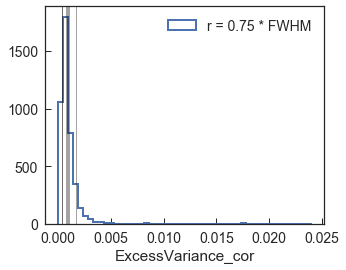

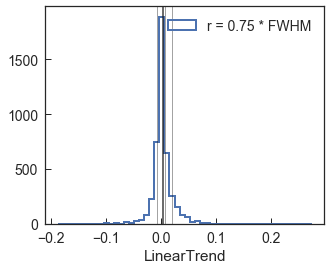

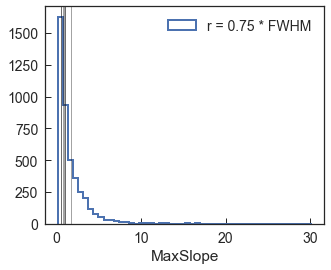

...

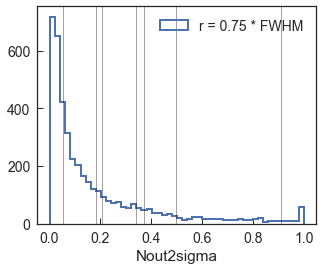

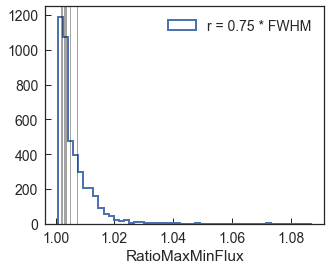

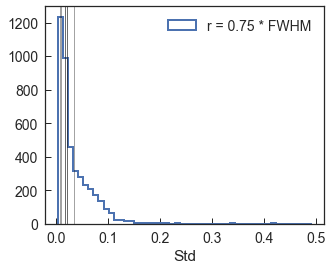

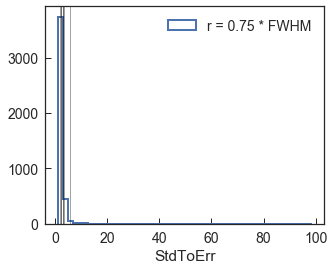

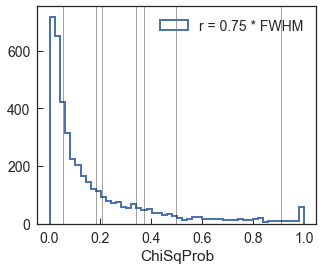

In [19]:
# histograms for some features for 3 apertures and clean data
cs = ['b', 'g', 'r']
for l, feat in enumerate(feat_to_hist):
    plt.figure(figsize=(5,4))
    to_plot = clean_feat_table[feat].dropna()
    sb.distplot(to_plot, kde=False, color='b',
                norm_hist=False, bins=50,
                label='r = %s * FWHM' % str(ap),
                hist_kws={"histtype": "step",
                          "linewidth": 2,
                          "alpha": 1})
    for bh in id_x_IMBH_paper[ano]:
        try:
            plt.axvline(x=feat_tables.loc[bh, feat],
                    color='k', lw=1, alpha=.4)
        except:
            continue
    plt.xlabel(feat)
    plt.legend(loc='upper right')
    #plt.yscale('log')
    plt.show()
    # break

In [20]:
# feature values summary of the identified IMBHs from papers.
clean_feat_table.loc[id_x_IMBH_paper[ano]]

,raMedian,decMedian,Amplitude,AndersonDarling,Autocor_length,Beyond1Std,CAR_mean,CAR_sigma,CAR_tau,ChiSqProb,...,spType,spCl,subClass,SPIRAL,ELLIPTICAL,UNCERTAIN,GZ_morph,gMag,gMag_k,Lum_d
internalID,,,,,,,,,,,,,,,,,,,,,
Blind15A_25_S9_0091_3884,147.286453,2.480811,0.016787,0.997580,1.0,0.076923,4531.996773,0.175992,0.004208,0.183928,...,GALAXY,GALAXY,STARFORMING,1.0,0.0,0.0,S,-20.029874,-19.694297,88.506433
Blind15A_24_S9_0534_1578,146.887733,0.217470,0.036384,0.453692,1.0,0.428571,5079.565818,-0.465007,0.004056,0.340949,...,GALAXY,GALAXY,STARFORMING,1.0,0.0,0.0,S,-19.513584,-19.284155,282.433930
Blind15A_06_S28_1763_0582,141.047755,2.389382,0.029707,0.702472,1.0,0.461538,4954.770385,-0.375520,0.004133,0.210119,...,GALAXY,GALAXY,STARFORMING,1.0,0.0,0.0,S,-20.423683,-20.282989,407.696204
Blind15A_34_N7_1583_2928,154.113852,-0.120709,0.071313,0.908732,1.0,0.214286,5685.136883,-0.840388,0.003514,0.910202,...,QSO,QSO,STARBURST BROADLINE,NaN,NaN,NaN,ND,-19.009232,-18.891207,432.759251
Blind15A_34_S15_0058_3864,152.785017,0.485730,0.048863,0.675769,1.0,0.285714,246.854619,0.078463,0.082415,0.373132,...,NaN,NaN,NaN,NaN,NaN,NaN,ND,NaN,NaN,NaN
Blind15A_36_N24_1954_2573,155.353727,1.455620,0.032095,0.305545,1.0,0.357143,5951.722070,-0.452612,0.003367,0.498241,...,GALAXY,GALAXY,STARFORMING,1.0,0.0,0.0,S,-20.497306,-20.290354,300.649998
Blind15A_47_N11_1859_2158,160.541798,-0.304108,0.021228,0.942382,1.0,0.266667,338.774040,0.046156,0.058812,0.057004,...,QSO,QSO,STARBURST BROADLINE,NaN,NaN,NaN,ND,-19.802646,-19.730558,531.531826


In [21]:
clean_feat_table.loc[id_x_IMBH_paper[ano], ['ExcessVariance_cor','MedianErr','StdToErr','Nout2sigma','MedianAbsDev']].sort(columns='ExcessVariance_cor')

,ExcessVariance_cor,MedianErr,StdToErr,Nout2sigma,MedianAbsDev
internalID,,,,,
Blind15A_47_N11_1859_2158,0.000385,0.005309,1.756580,0.057004,0.002589
Blind15A_25_S9_0091_3884,0.000408,0.004226,2.056403,0.183928,0.003530
Blind15A_06_S28_1763_0582,0.000797,0.008083,2.219352,0.210119,0.014190
Blind15A_36_N24_1954_2573,0.000891,0.005725,3.236936,0.498241,0.015540
Blind15A_24_S9_0534_1578,0.000978,0.007754,2.802696,0.340949,0.014632
Blind15A_34_S15_0058_3864,0.001023,0.007502,2.932775,0.373132,0.008114
Blind15A_34_N7_1583_2928,0.001724,0.006166,5.467477,0.910202,0.018925


In [22]:
# fancy filter to select variable galaxies
mask = ('zsp > 0 and gmag > 15 and gmag < 25 and '+
        'ExcessVariance_cor > 0.001 and '+
        'Amplitude < .2 and MedianAbsDev > 0.015 and '+
        'MedianErr < .05 and StdToErr > 2.8')
print 'This is the filter applied:'
print mask
highly_var = clean_feat_table.query(mask)
print '_____________________________________________'
print 'Number of sources after variable filter: ', highly_var.shape[0]

This is the filter applied:
zsp > 0 and gmag > 15 and gmag < 25 and ExcessVariance_cor > 0.001 and Amplitude < .2 and MedianAbsDev > 0.015 and MedianErr < .05 and StdToErr > 2.8
_____________________________________________
Number of sources after variable filter:  200


In [23]:
highly_var.loc[id_x_IMBH_paper[ano], feat_to_hist]

,Amplitude,Beyond1Std,ExcessVariance_cor,LinearTrend,MaxSlope,Meanvariance,MedianErr,MedianAbsDev,PercentAmplitude,Nout2sigma,RatioMaxMinFlux,Std,StdToErr,ChiSqProb
internalID,,,,,,,,,,,,,,
Blind15A_25_S9_0091_3884,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Blind15A_24_S9_0534_1578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Blind15A_06_S28_1763_0582,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Blind15A_34_N7_1583_2928,0.071313,0.214286,0.001724,-0.00674,1.64459,0.001754,0.006166,0.018925,0.005381,0.910202,1.007174,0.035039,5.467477,0.910202
Blind15A_34_S15_0058_3864,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Blind15A_36_N24_1954_2573,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Blind15A_47_N11_1859_2158,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [24]:
agn_id = highly_var.query('subClass == "AGN"').index.values
print agn_id

['Blind15A_14_S28_1036_1668' 'Blind15A_16_N24_0245_0193'
 'Blind15A_27_N3_1733_0372' 'Blind15A_45_S6_1211_1269'
 'Blind15A_47_S20_1232_3249']


In [25]:
print highly_var.spType.value_counts()
print '________________________________'
print highly_var.spCl.value_counts()
print '________________________________'
print highly_var.subClass.value_counts()

GALAXY     178
QA           8
QSO          8
LRG          5
ROSAT_D      1
Name: spType, dtype: int64
________________________________
GALAXY    199
QSO         1
Name: spCl, dtype: int64
________________________________
STARFORMING            91
STARBURST              19
AGN                     5
BROADLINE               2
AGN BROADLINE           1
STARBURST BROADLINE     1
Name: subClass, dtype: int64


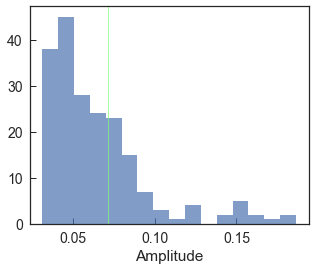

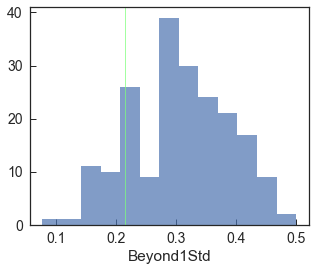

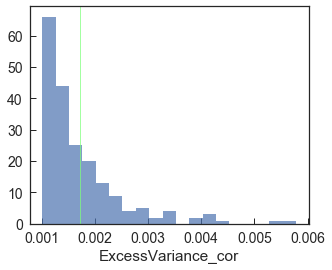

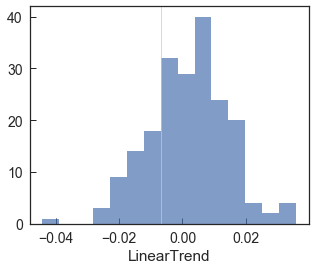

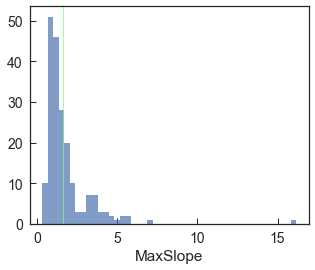

...

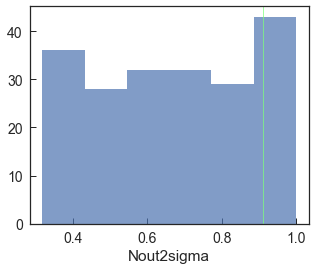

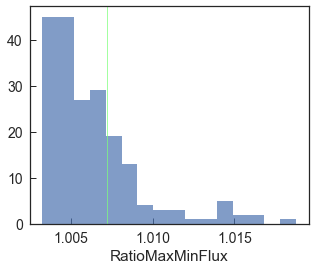

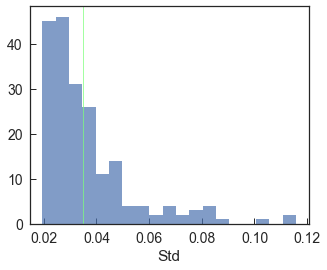

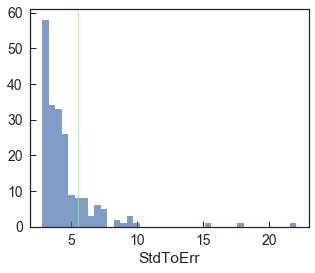

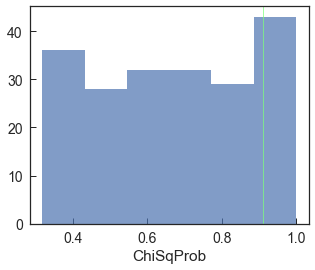

In [26]:
# colors are the values for the IMBHs from papers
# same colors are same BHs
c = cm.jet(np.linspace(0, 1, len(id_x_IMBH_paper[ano])))
for l, feat in enumerate(feat_to_hist):
    plt.figure(figsize=(5,4))
    to_plot = highly_var[feat].dropna()
    sb.distplot(to_plot, kde=False, color='b',
                norm_hist=False,
                hist_kws={"histtype": "stepfilled",
                          "linewidth": 0,
                          "alpha": .7})
    for k, bh in enumerate(id_x_IMBH_paper[ano]):
        try:
            plt.axvline(x=highly_var.loc[bh, feat],
                        color=c[k], lw=1, alpha=.7, ls='-')
        except: continue
    plt.xlabel(feat)
    plt.legend(loc='upper right')
    plt.show()

### Physical params plots

### Bimodality in z distribution for full galaxy sample from SDSS

## Variable SDSS galaxies

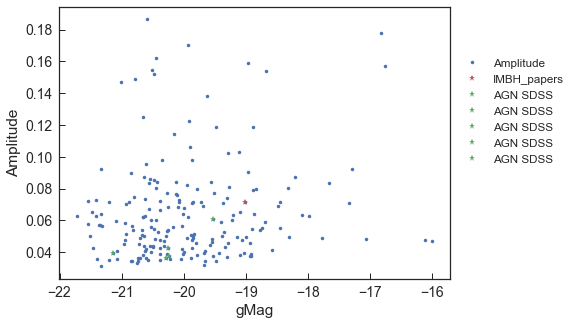

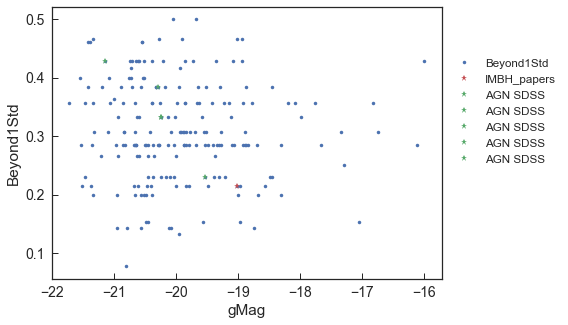

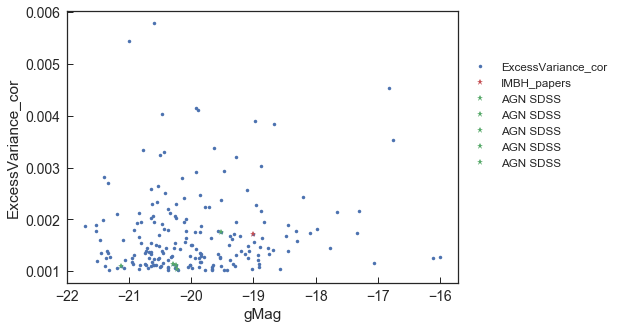

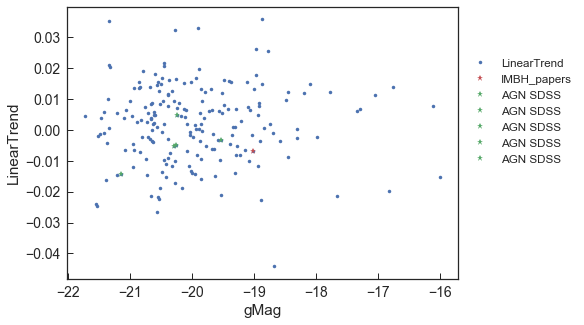

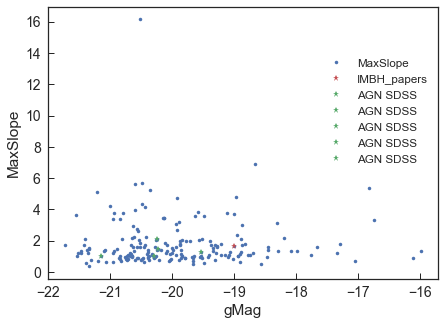

...

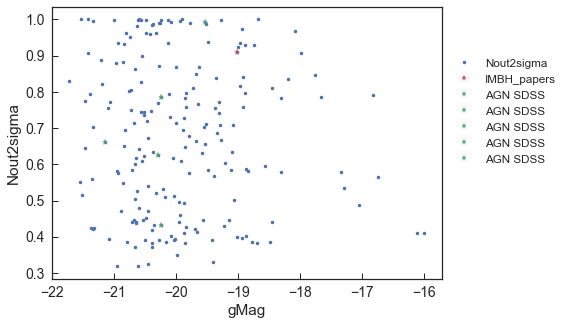

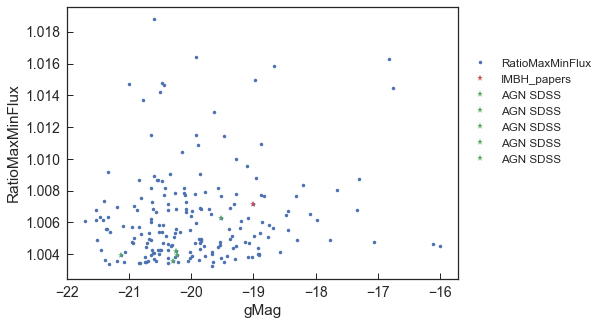

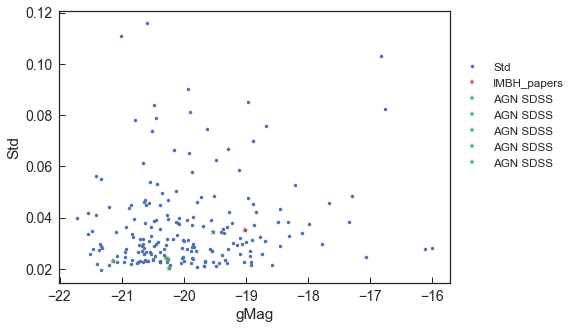

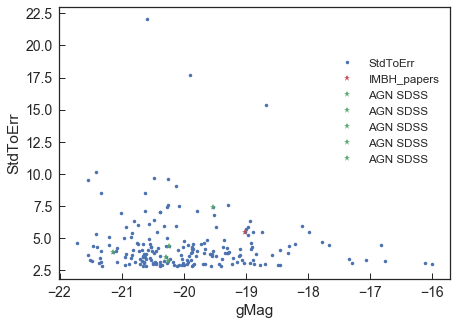

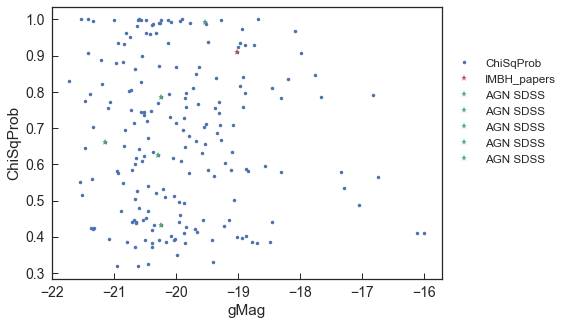

In [27]:
# colors are the values for the IMBHs from papers
# same colors are same BHs
for l, feat in enumerate(feat_to_hist):
    plt.figure(figsize=(7,5))
    plt.plot(highly_var.gMag, highly_var[feat], '.b')
    for k, bh in enumerate(id_x_IMBH_paper[ano]):
        try:
            plt.plot(highly_var.loc[bh, 'gMag'], highly_var.loc[bh, feat],
                     '*r', label='IMBH_papers')
        except: continue
    for k, agn in enumerate(agn_id):
        try:
            plt.plot(highly_var.loc[agn, 'gMag'], highly_var.loc[agn, feat],
                     '*g', label='AGN SDSS')
        except: continue
    plt.xlabel('gMag')
    plt.ylabel(feat)
    plt.legend(bbox_to_anchor=(+1., .85), fontsize='x-small')
    plt.show()

### LC & stamps plots

In [28]:
print stats.mode(feat_tables.query('ExcessVariance_cor >= 0').ExcessVariance_cor.values)
print np.median(feat_tables.query('ExcessVariance_cor >= 0').ExcessVariance_cor.values)
print np.std(feat_tables.query('ExcessVariance_cor >= 0').ExcessVariance_cor.values)

ModeResult(mode=array([ 0.]), count=array([1563]))
0.000545544973414
0.00130729997644


In [29]:
peak = feat_tables.query('ExcessVariance_cor > 0 and ExcessVariance_cor < 1e4 and MedianErr < 0.01')
print peak.shape

(2189, 91)


In [30]:
var_14_not_2015_high_EV = ['Blind15A_34_N5_1155_0381', 'Blind15A_47_N17_0215_4028',
       'Blind15A_27_N19_0414_2591', 'Blind15A_27_S11_1581_2292',
       'Blind15A_34_N5_0636_3455', 'Blind15A_27_N27_1846_2645',
       'Blind15A_47_N19_1398_1887']

 Blind15A_16_S3_1173_3927
raMedian              145.134
decMedian              1.7764
Amplitude          0.00893061
Std                0.00513666
ExcessVariance      0.0002128
StdToErr              1.56404
Nout2sigma          0.0760922
Beyond1Std           0.307692
Mean                    18.56
zsp                   0.04924
gmag                   16.098
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_16_S3_1173_3927, dtype: object
True

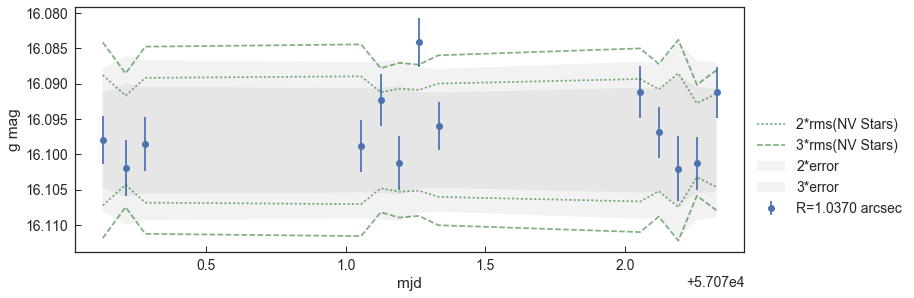

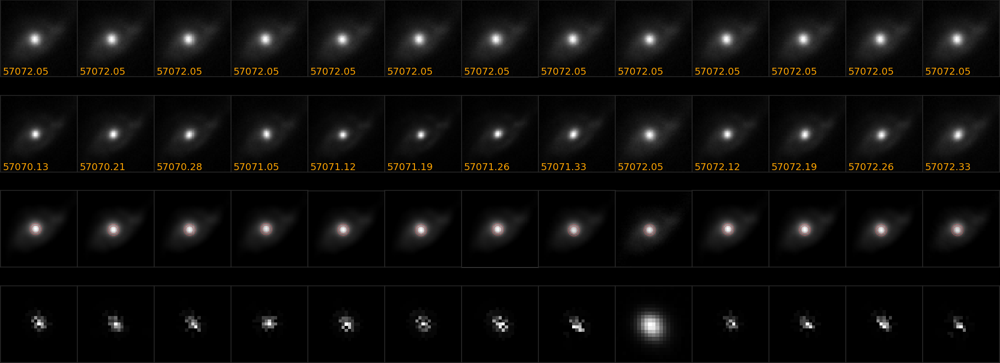

 ----------------------
Blind15A_45_N7_0648_2271
raMedian             157.802
decMedian            1.80813
Amplitude         0.00987119
Std               0.00553336
ExcessVariance    0.00015191
StdToErr             1.17738
Nout2sigma         0.0163954
Beyond1Std          0.357143
Mean                 19.2268
zsp                   0.0888
gmag                  16.728
spType                GALAXY
spCl                  GALAXY
subClass                 AGN
GZ_morph                   S
Name: Blind15A_45_N7_0648_2271, dtype: object
True

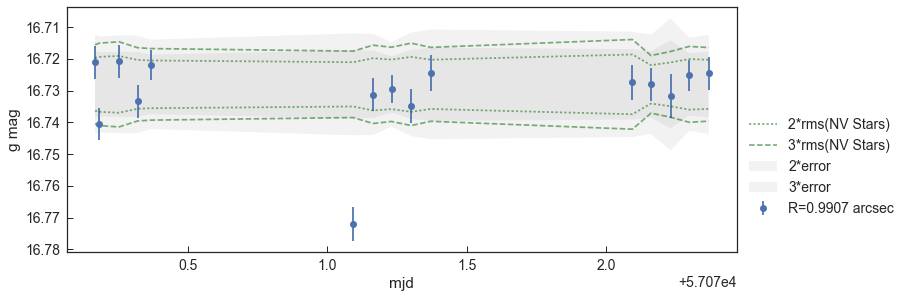

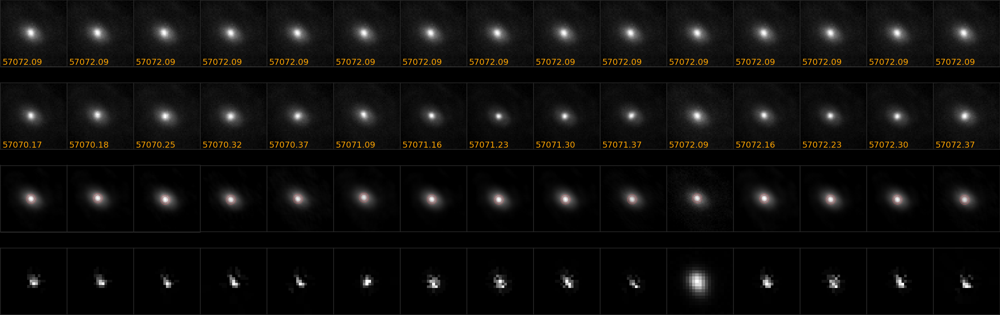

 ----------------------
Blind15A_04_S24_0576_1257
raMedian              137.787
decMedian             0.31133
Amplitude           0.0101989
Std                0.00657355
ExcessVariance              0
StdToErr             0.030604
Nout2sigma        2.49228e-05
Beyond1Std           0.307692
Mean                  20.0426
zsp                    0.0702
gmag                   16.534
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_04_S24_0576_1257, dtype: object
True

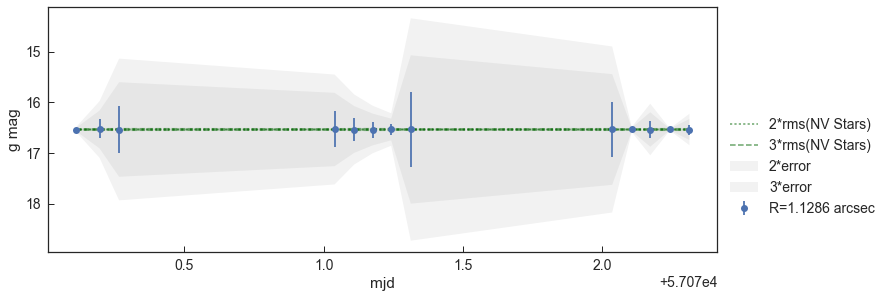

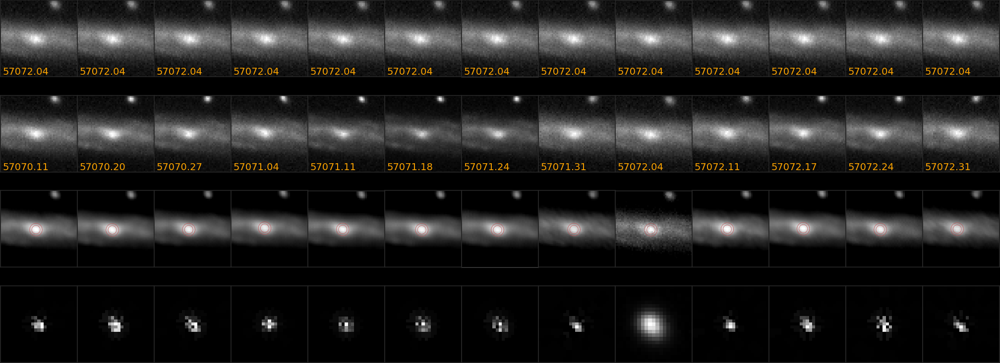

 ----------------------
Blind15A_17_S2_1327_2110
raMedian              143.536
decMedian           -0.235145
Amplitude            0.010371
Std                0.00492971
ExcessVariance    0.000124326
StdToErr              1.14383
Nout2sigma          0.0127756
Beyond1Std           0.214286
Mean                  19.2494
zsp                   0.05047
gmag                   17.612
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_17_S2_1327_2110, dtype: object
True

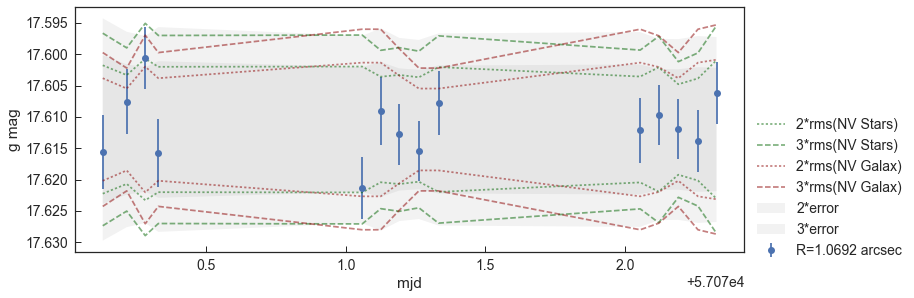

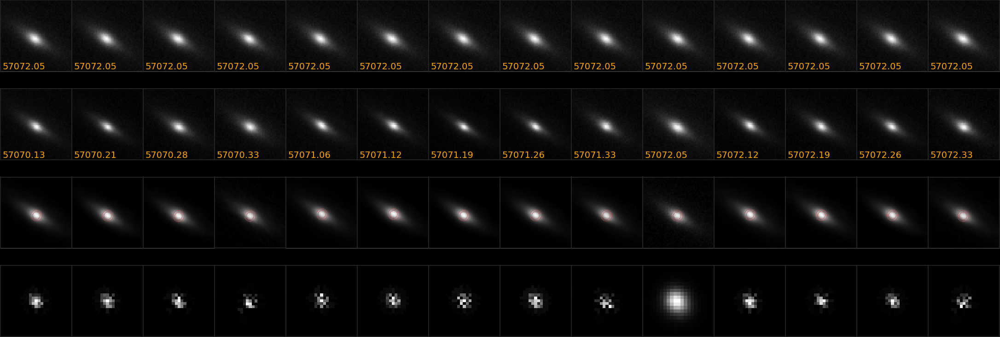

 ----------------------
Blind15A_34_S27_0346_0472
raMedian              153.159
decMedian            0.793122
Amplitude           0.0105056
Std                0.00723566
ExcessVariance    0.000293404
StdToErr              1.59359
Nout2sigma          0.0588575
Beyond1Std                0.5
Mean                  19.2012
zsp                   0.08724
gmag                   16.967
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_34_S27_0346_0472, dtype: object
True

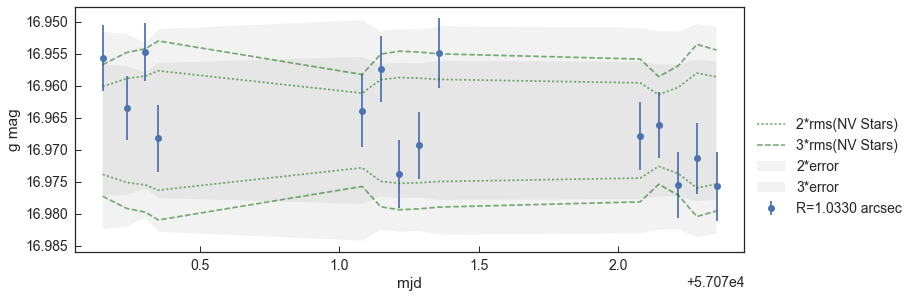

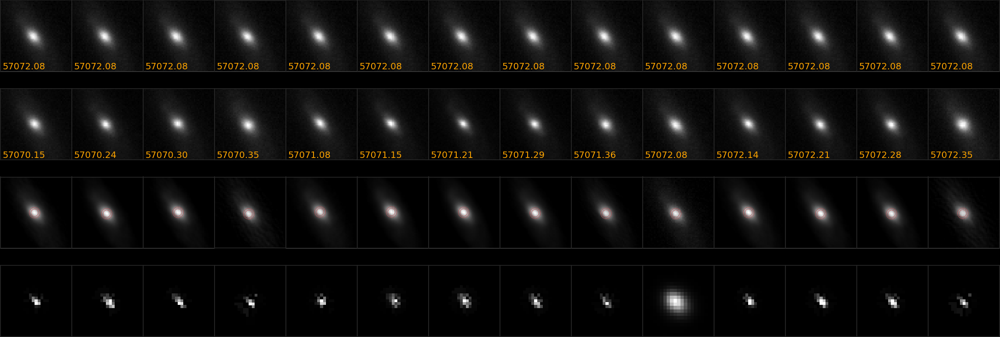

 ----------------------
Blind15A_16_N1_1543_1013
raMedian                144.3
decMedian             1.58519
Amplitude           0.0106075
Std                0.00580369
ExcessVariance    0.000209305
StdToErr              1.38738
Nout2sigma          0.0390601
Beyond1Std           0.307692
Mean                  19.2202
zsp                   0.07081
gmag                   17.658
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_16_N1_1543_1013, dtype: object
True

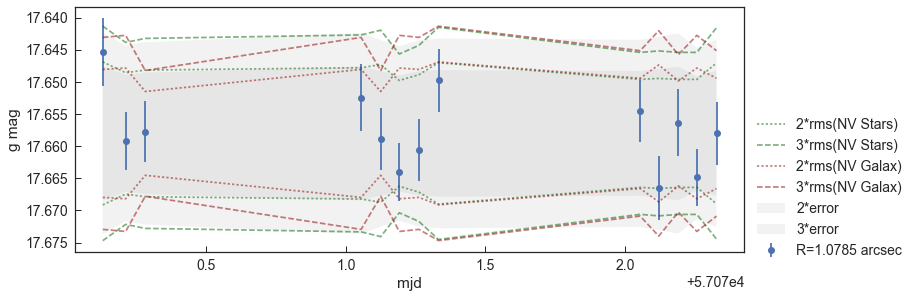

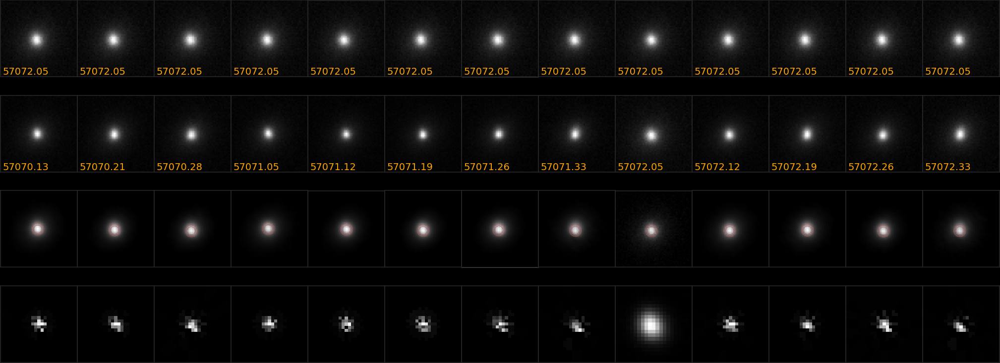

 ----------------------
Blind15A_44_N13_1708_2837
raMedian              158.843
decMedian           -0.434092
Amplitude           0.0115863
Std                0.00774428
ExcessVariance              0
StdToErr             0.234563
Nout2sigma        5.45134e-05
Beyond1Std           0.428571
Mean                  20.3781
zsp                   0.08326
gmag                   18.468
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_44_N13_1708_2837, dtype: object
True

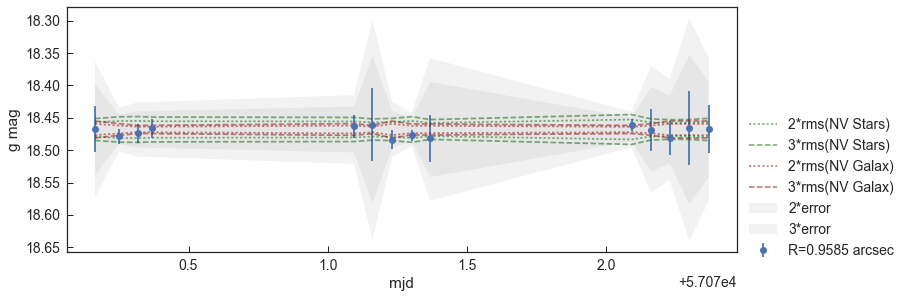

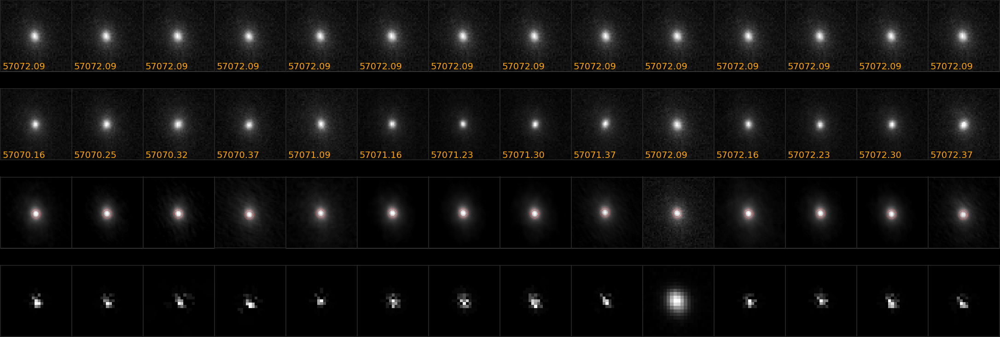

 ----------------------
Blind15A_44_N27_1153_1553
raMedian             158.127
decMedian          -0.886441
Amplitude          0.0116649
Std               0.00711185
ExcessVariance    0.00028155
StdToErr             1.57785
Nout2sigma         0.0510791
Beyond1Std          0.285714
Mean                 19.5388
zsp                  0.11443
gmag                  17.719
spType                GALAXY
spCl                  GALAXY
subClass                 NaN
GZ_morph                   S
Name: Blind15A_44_N27_1153_1553, dtype: object
True

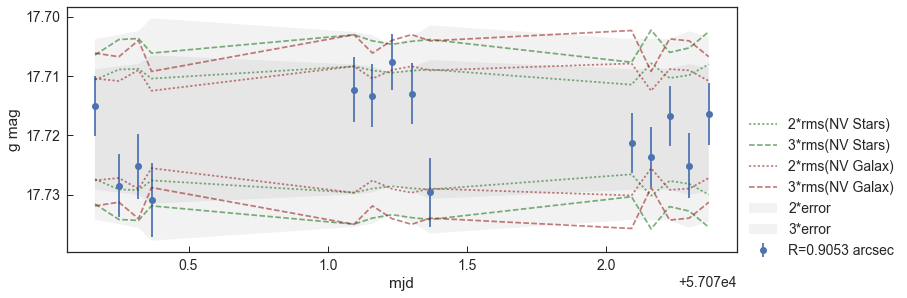

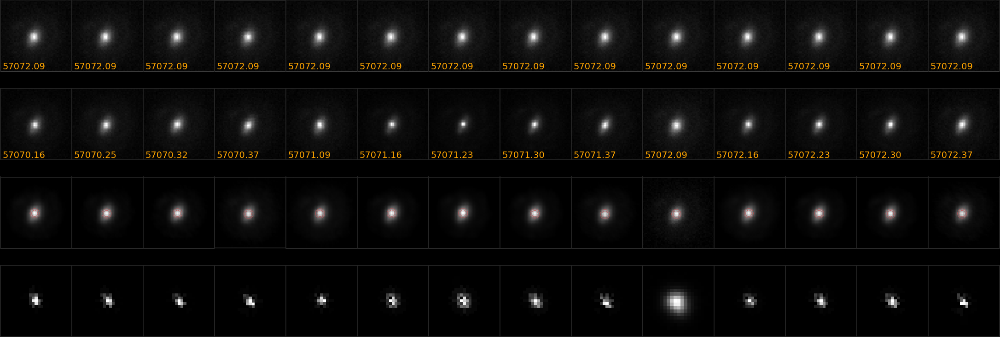

 ----------------------
Blind15A_47_S20_0246_3092
raMedian              159.834
decMedian            0.637352
Amplitude           0.0117767
Std                0.00721032
ExcessVariance    0.000306483
StdToErr              1.73494
Nout2sigma          0.0586077
Beyond1Std                0.4
Mean                  19.2249
zsp                   0.08006
gmag                    16.43
spType                 GALAXY
spCl                   GALAXY
subClass            BROADLINE
GZ_morph                    S
Name: Blind15A_47_S20_0246_3092, dtype: object
True

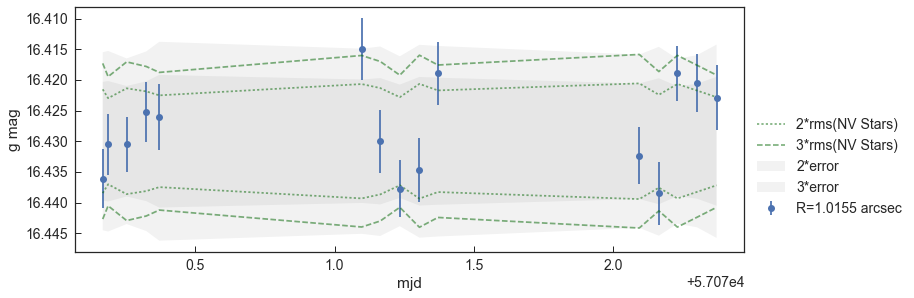

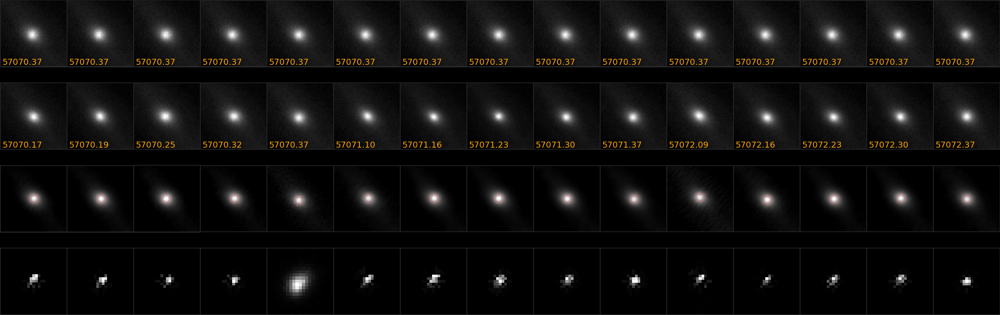

 ----------------------
Blind15A_06_N31_1721_0752
raMedian              140.903
decMedian            0.748313
Amplitude            0.011958
Std                0.00756872
ExcessVariance    0.000259431
StdToErr              1.34442
Nout2sigma          0.0400699
Beyond1Std           0.307692
Mean                  19.4997
zsp                   0.05645
gmag                   17.434
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_06_N31_1721_0752, dtype: object
True

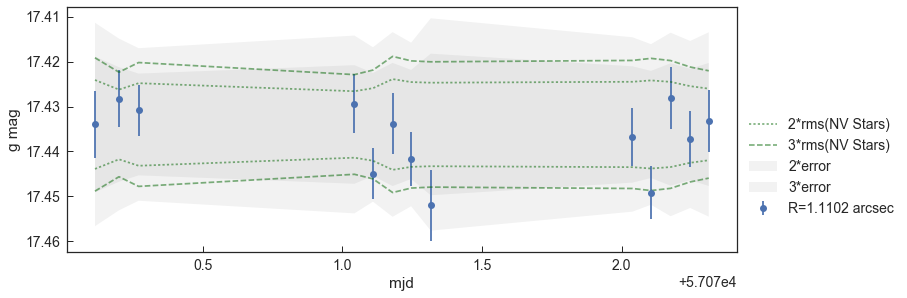

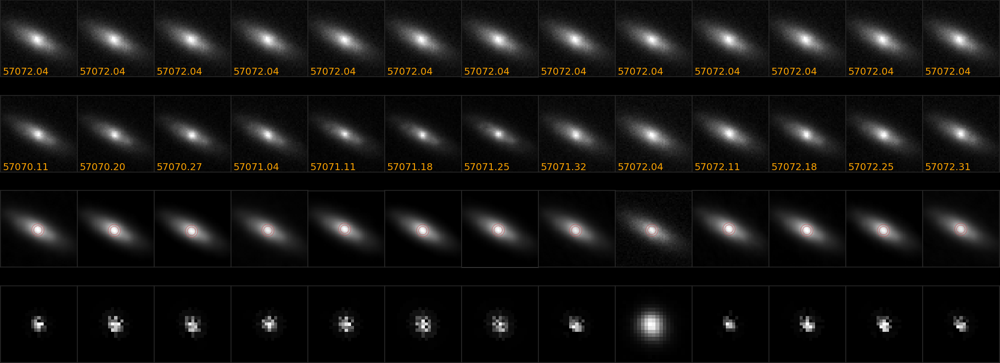

 ----------------------
Blind15A_46_N26_0274_3429
raMedian              159.109
decMedian             1.17786
Amplitude            0.011967
Std                0.00741449
ExcessVariance    0.000267336
StdToErr              1.42968
Nout2sigma          0.0241821
Beyond1Std                0.4
Mean                  19.8213
zsp                   0.06089
gmag                   18.322
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_46_N26_0274_3429, dtype: object
True

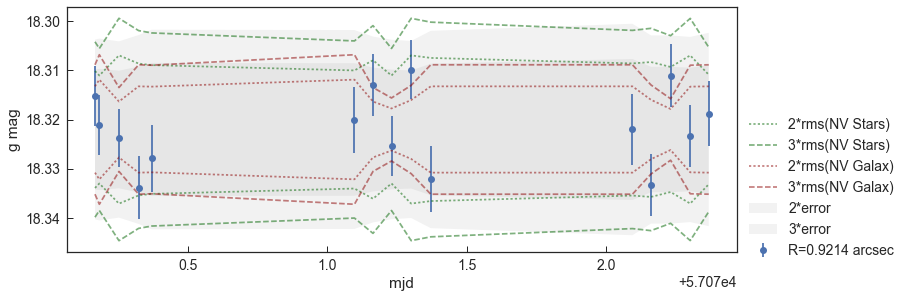

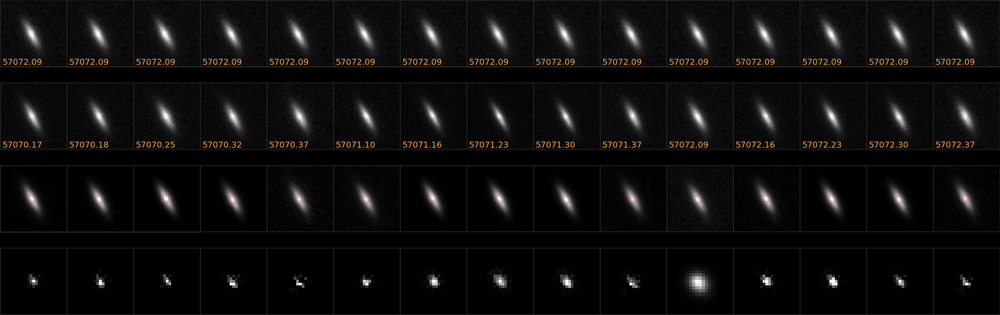

 ----------------------
Blind15A_17_S9_0619_3235
raMedian              143.773
decMedian          -0.0189311
Amplitude           0.0125962
Std                0.00799232
ExcessVariance    0.000273263
StdToErr              1.37417
Nout2sigma          0.0308421
Beyond1Std           0.357143
Mean                  20.0604
zsp                   0.08243
gmag                   18.238
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_17_S9_0619_3235, dtype: object
True

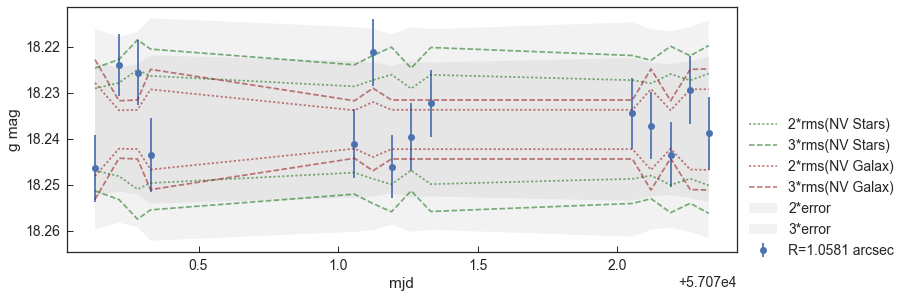

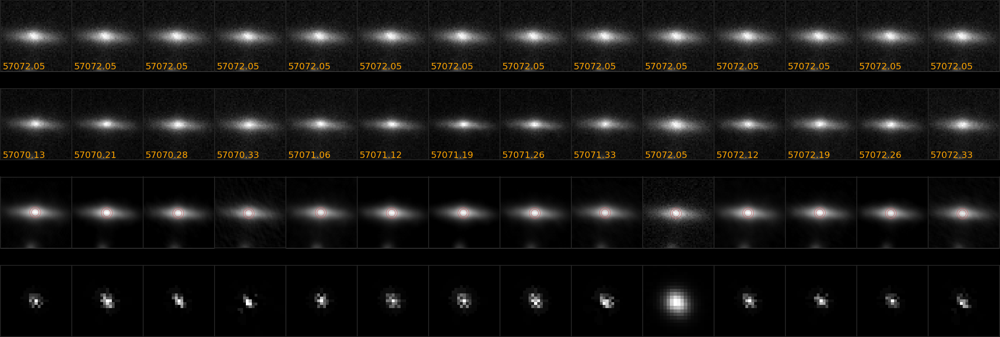

 ----------------------
Blind15A_37_N4_0494_2826
raMedian              155.444
decMedian           0.0555515
Amplitude           0.0128963
Std                0.00746867
ExcessVariance    0.000273816
StdToErr              1.45434
Nout2sigma          0.0321896
Beyond1Std           0.285714
Mean                  19.8051
zsp                   0.11214
gmag                   18.375
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_37_N4_0494_2826, dtype: object
True

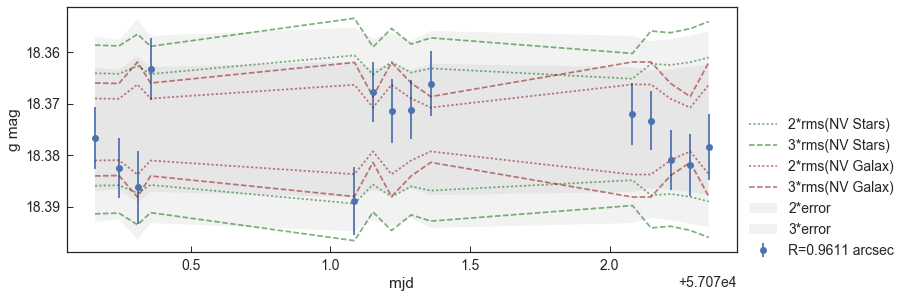

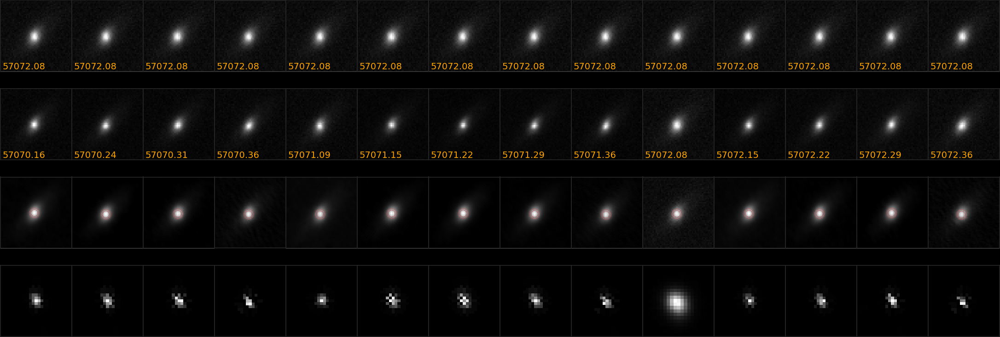

 ----------------------
Blind15A_34_N19_0959_2692
raMedian              153.941
decMedian           -0.403582
Amplitude           0.0129306
Std                0.00735856
ExcessVariance    0.000295759
StdToErr               1.5991
Nout2sigma          0.0580052
Beyond1Std           0.285714
Mean                  19.4151
zsp                   0.08445
gmag                   17.796
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_34_N19_0959_2692, dtype: object
True

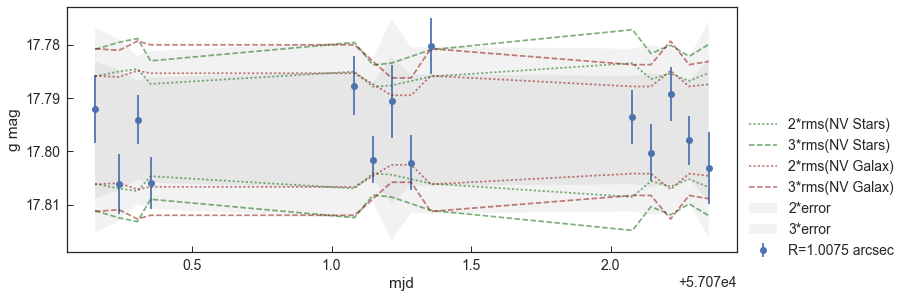

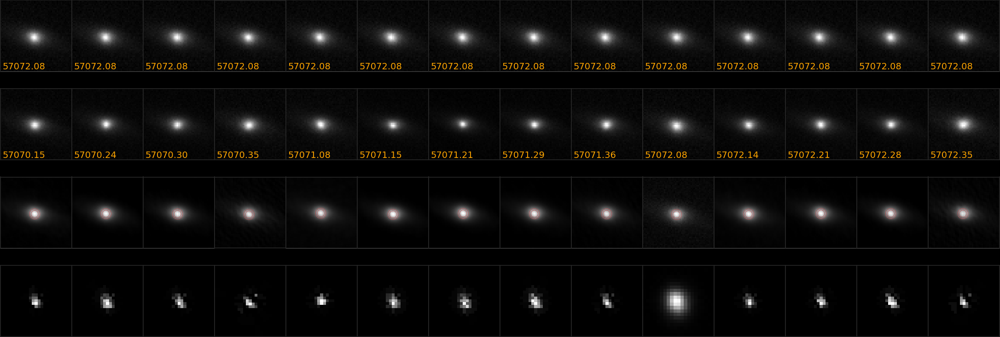

 ----------------------
Blind15A_45_N16_0473_1301
raMedian              156.643
decMedian             1.49267
Amplitude           0.0130001
Std                0.00814859
ExcessVariance    0.000272738
StdToErr              1.31744
Nout2sigma          0.0194531
Beyond1Std           0.333333
Mean                  19.4509
zsp                   0.09915
gmag                   17.819
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_45_N16_0473_1301, dtype: object
True

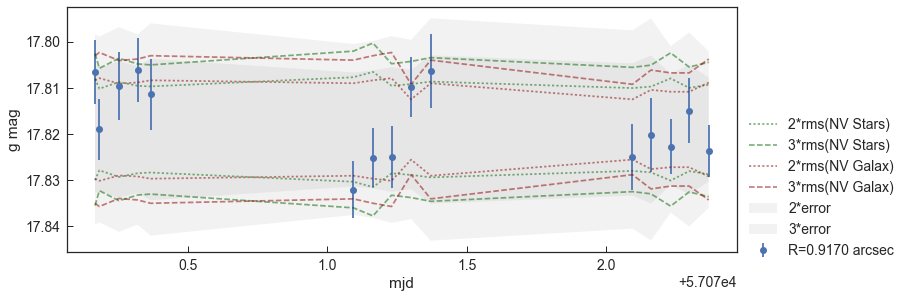

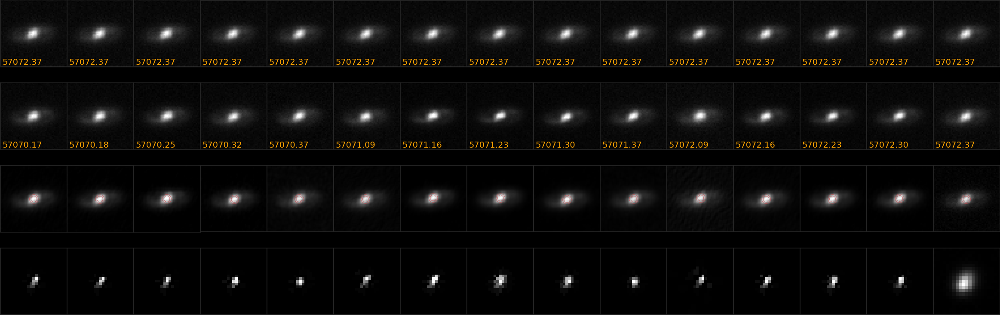

 ----------------------
Blind15A_17_N13_1278_2436
raMedian              144.958
decMedian           -0.561508
Amplitude             0.01302
Std                0.00699183
ExcessVariance              0
StdToErr             0.205931
Nout2sigma        6.11275e-06
Beyond1Std           0.214286
Mean                  19.8168
zsp                   0.03029
gmag                   16.077
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_17_N13_1278_2436, dtype: object
True

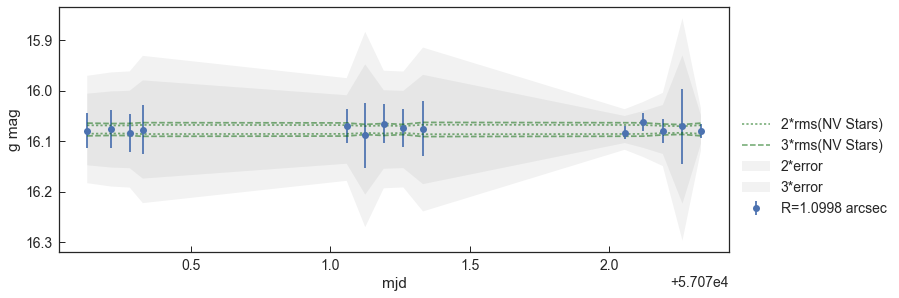

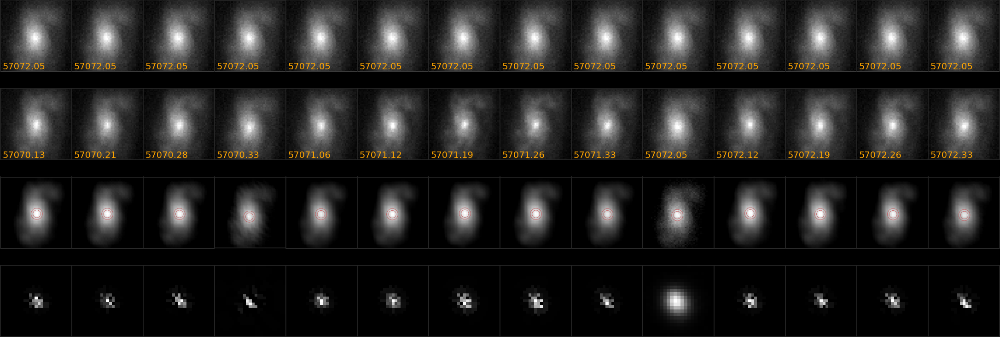

 ----------------------
Blind15A_34_N5_0437_1447
raMedian              153.385
decMedian          -0.0365481
Amplitude            0.013348
Std                0.00808873
ExcessVariance    0.000328769
StdToErr              1.63614
Nout2sigma          0.0579381
Beyond1Std           0.428571
Mean                  19.4729
zsp                    0.0923
gmag                   18.061
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_34_N5_0437_1447, dtype: object
True

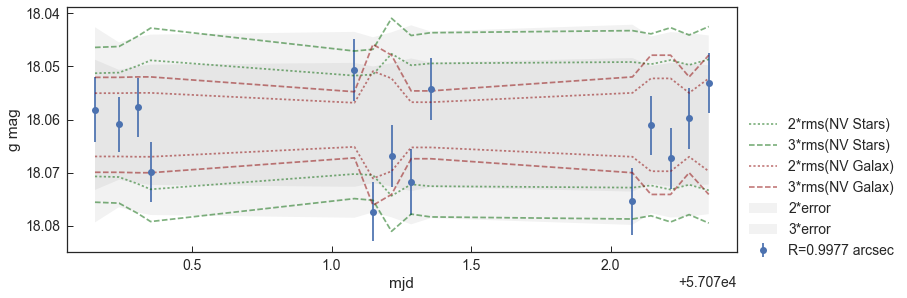

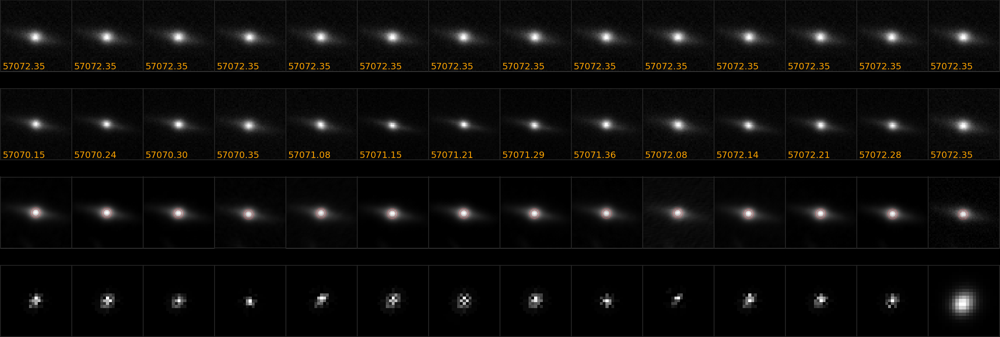

 ----------------------
Blind15A_44_S21_0351_3344
raMedian              157.794
decMedian             0.48883
Amplitude           0.0133583
Std                0.00874981
ExcessVariance    0.000281753
StdToErr              1.31991
Nout2sigma          0.0268931
Beyond1Std           0.428571
Mean                  20.2691
zsp                   0.09692
gmag                   18.345
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_44_S21_0351_3344, dtype: object
True

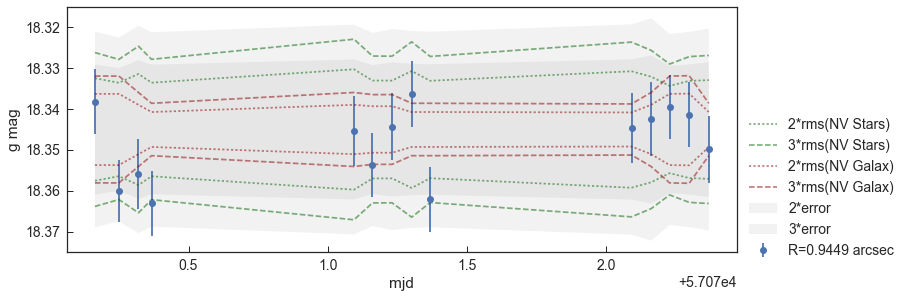

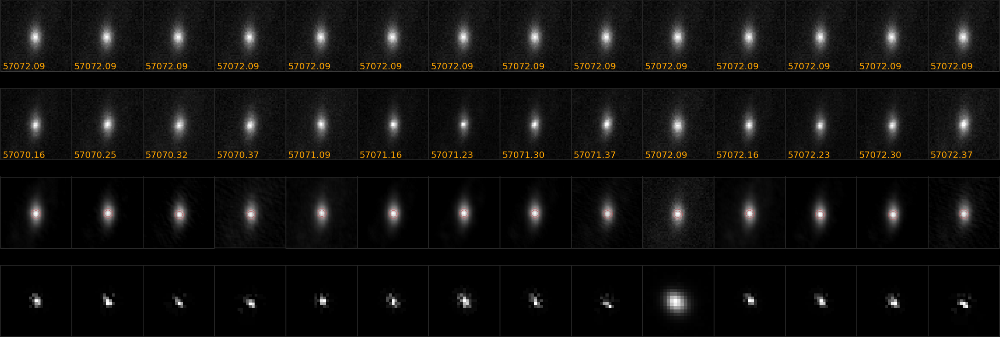

 ----------------------
Blind15A_45_N19_0590_2980
raMedian              157.698
decMedian             1.48386
Amplitude           0.0134121
Std                0.00839844
ExcessVariance    0.000367665
StdToErr              1.69148
Nout2sigma            0.06123
Beyond1Std                0.4
Mean                  18.4232
zsp                   0.05101
gmag                   16.014
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_45_N19_0590_2980, dtype: object
True

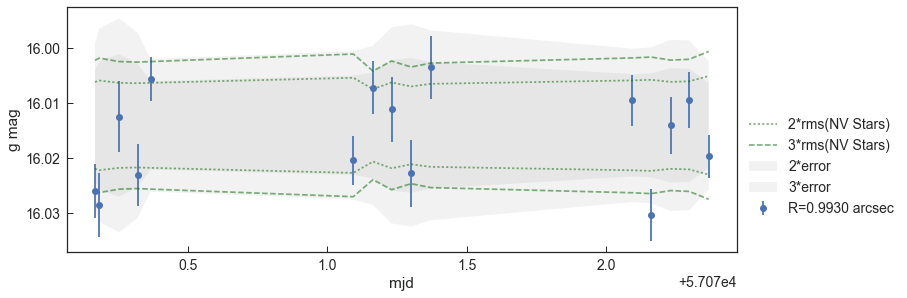

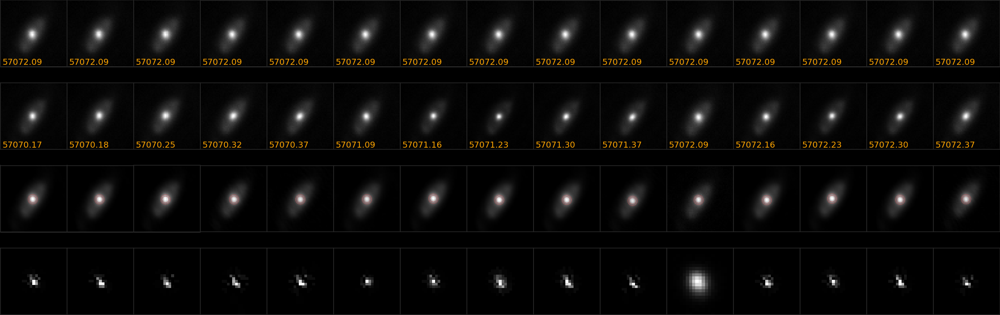

 ----------------------
Blind15A_37_S18_1927_1996
raMedian               155.85
decMedian             0.44428
Amplitude           0.0134727
Std                0.00927624
ExcessVariance    0.000333087
StdToErr              1.44788
Nout2sigma          0.0337678
Beyond1Std           0.428571
Mean                    20.14
zsp                   0.09649
gmag                   18.165
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_37_S18_1927_1996, dtype: object
True

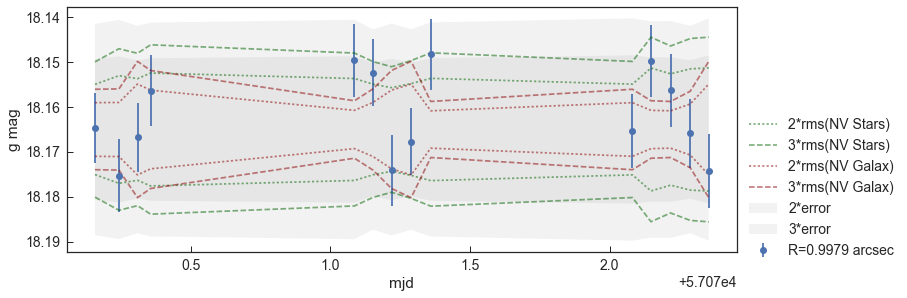

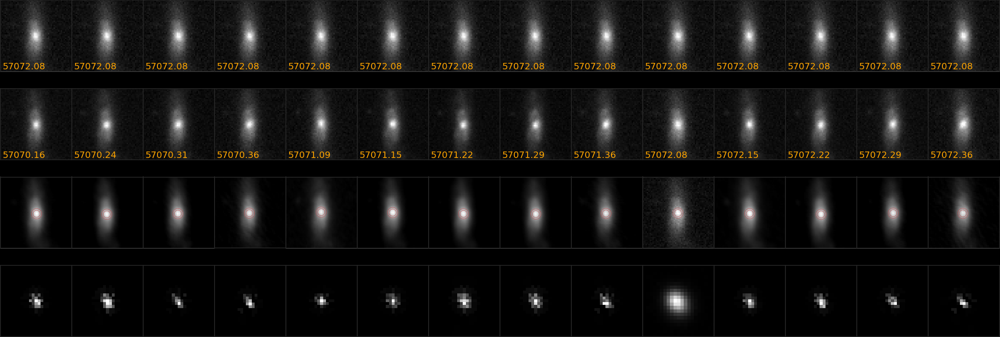

 ----------------------
Blind15A_07_S13_1179_2653
raMedian              140.355
decMedian          -0.0621198
Amplitude            0.013528
Std                0.00714202
ExcessVariance    0.000327603
StdToErr              2.02466
Nout2sigma           0.151457
Beyond1Std           0.153846
Mean                  18.9561
zsp                   0.08781
gmag                   16.899
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_07_S13_1179_2653, dtype: object
True

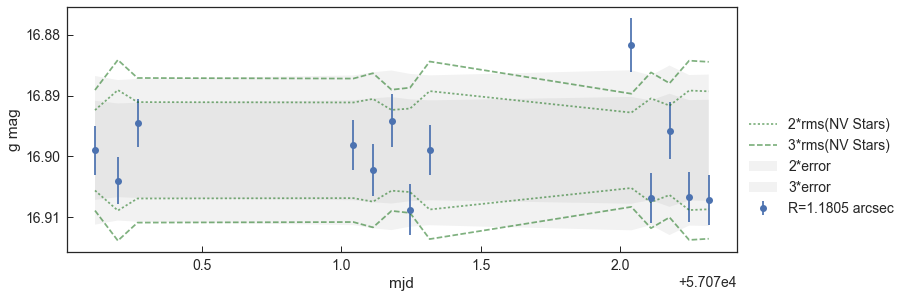

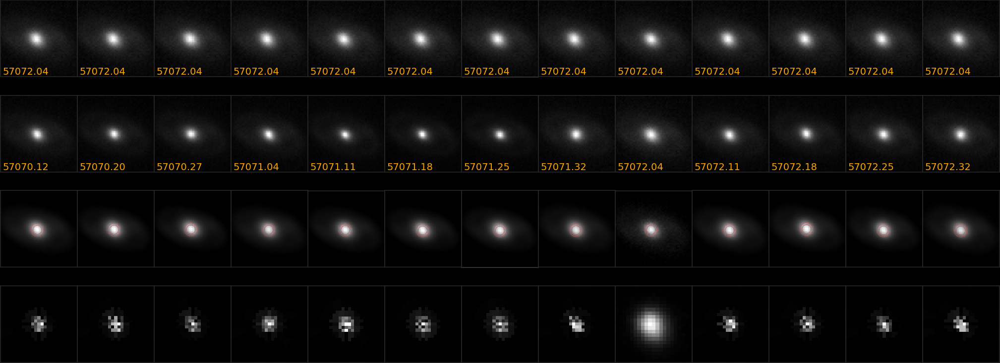

 ----------------------
Blind15A_17_S2_0634_1168
raMedian              143.467
decMedian           -0.184409
Amplitude           0.0135968
Std                0.00675649
ExcessVariance    0.000196988
StdToErr              1.22607
Nout2sigma          0.0178719
Beyond1Std           0.214286
Mean                  19.8452
zsp                   0.12887
gmag                   18.367
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_17_S2_0634_1168, dtype: object
True

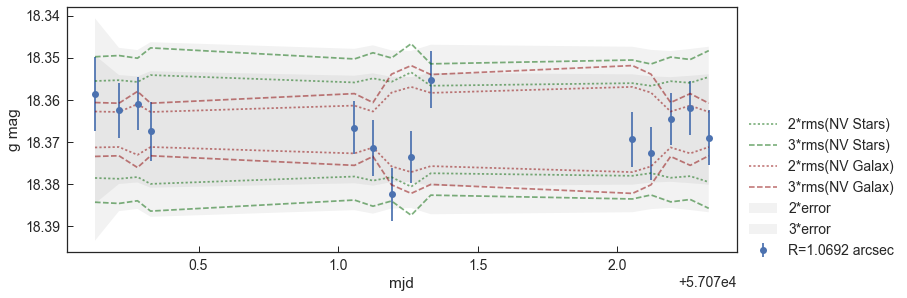

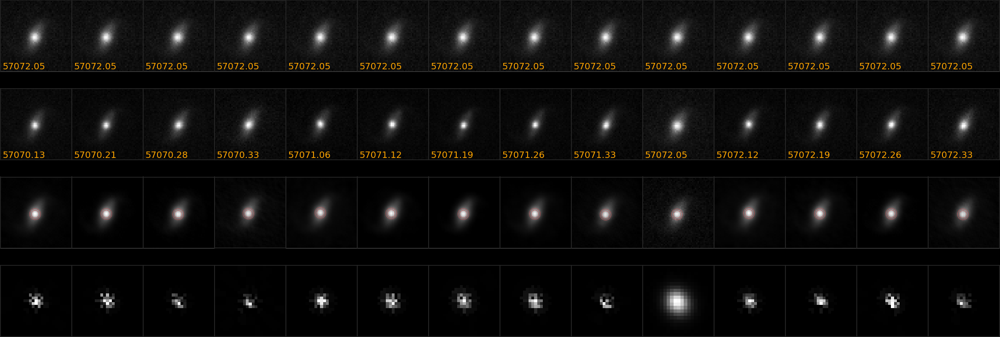

 ----------------------
Blind15A_37_N12_1922_1328
raMedian             155.801
decMedian          -0.213951
Amplitude          0.0136416
Std               0.00803123
ExcessVariance     0.0003108
StdToErr             1.55517
Nout2sigma         0.0570766
Beyond1Std          0.285714
Mean                   19.79
zsp                  0.09814
gmag                  17.845
spType                GALAXY
spCl                  GALAXY
subClass                 NaN
GZ_morph                   S
Name: Blind15A_37_N12_1922_1328, dtype: object
True

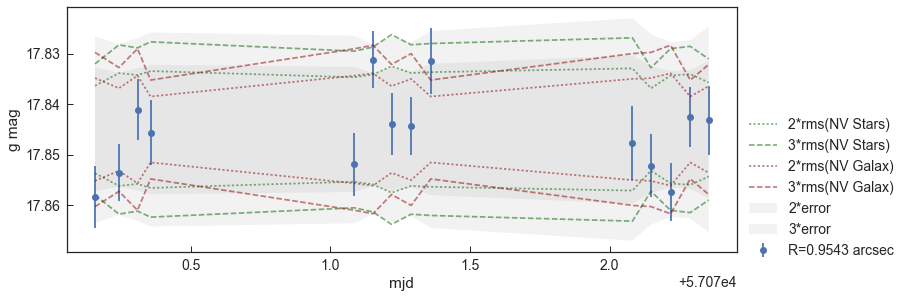

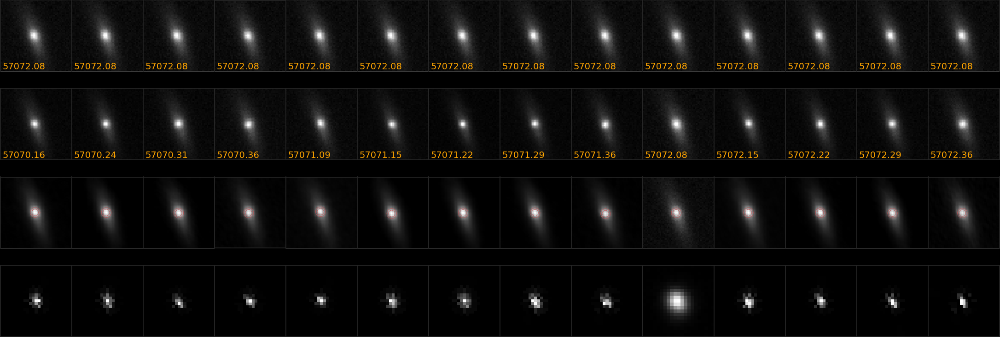

 ----------------------
Blind15A_14_N6_0356_0914
raMedian              142.383
decMedian           -0.328954
Amplitude           0.0136567
Std                0.00741311
ExcessVariance    0.000305516
StdToErr              1.62145
Nout2sigma          0.0691155
Beyond1Std           0.307692
Mean                  19.1001
zsp                   0.07121
gmag                   16.886
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_14_N6_0356_0914, dtype: object
True

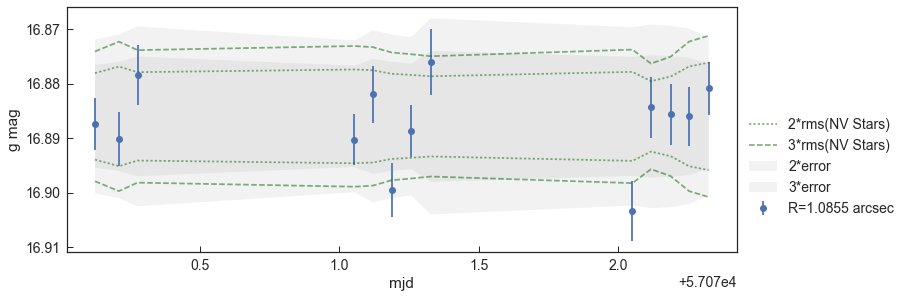

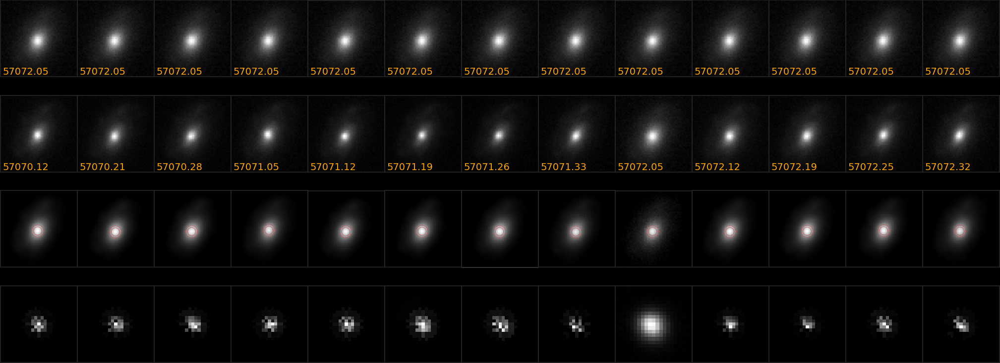

 ----------------------
Blind15A_07_S21_0439_3666
raMedian              139.341
decMedian            0.321827
Amplitude           0.0136981
Std                0.00714916
ExcessVariance    0.000309284
StdToErr              1.80556
Nout2sigma           0.105375
Beyond1Std           0.230769
Mean                  19.2461
zsp                   0.05405
gmag                   15.596
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_07_S21_0439_3666, dtype: object
True

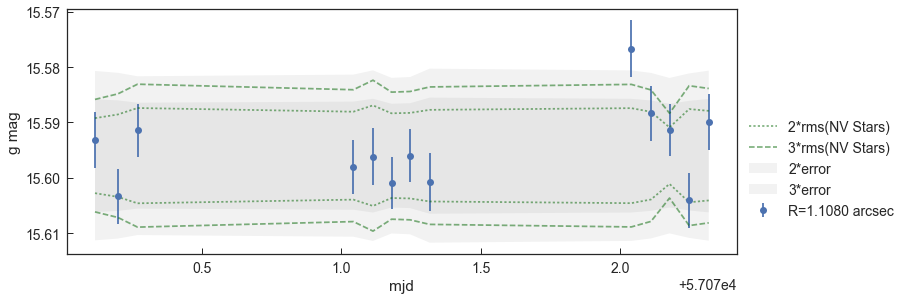

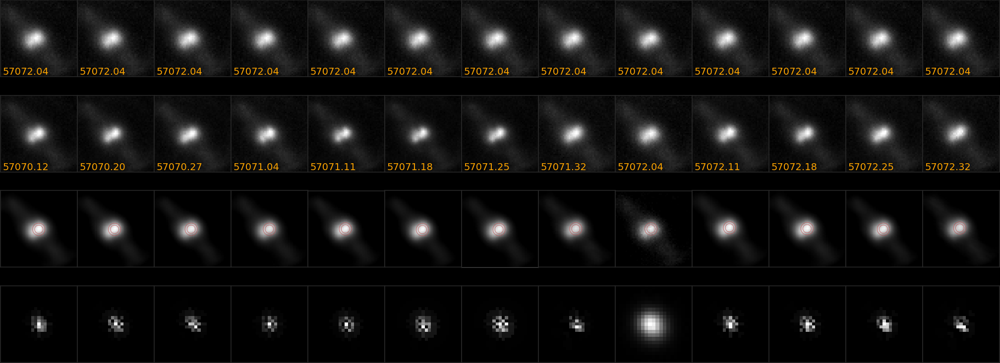

 ----------------------
Blind15A_15_S20_0943_1294
raMedian              142.321
decMedian             2.28655
Amplitude           0.0137759
Std                0.00883208
ExcessVariance    0.000286426
StdToErr              1.32256
Nout2sigma          0.0368646
Beyond1Std           0.384615
Mean                  20.1801
zsp                   0.05156
gmag                   18.159
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_15_S20_0943_1294, dtype: object
True

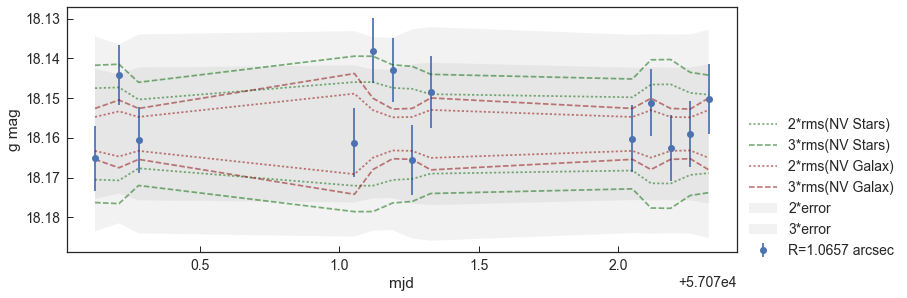

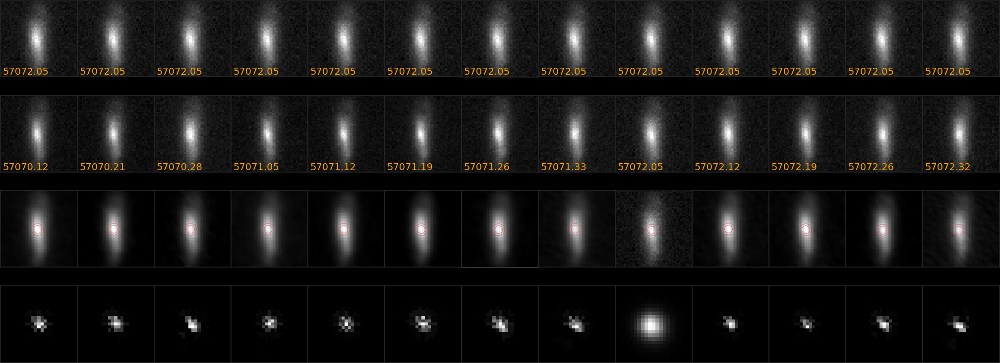

 ----------------------
Blind15A_34_N5_1483_0954
raMedian              153.349
decMedian           -0.113128
Amplitude           0.0139283
Std                0.00854303
ExcessVariance    0.000341095
StdToErr              1.61445
Nout2sigma          0.0618054
Beyond1Std           0.357143
Mean                  19.6628
zsp                   0.09574
gmag                   18.229
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_34_N5_1483_0954, dtype: object
True

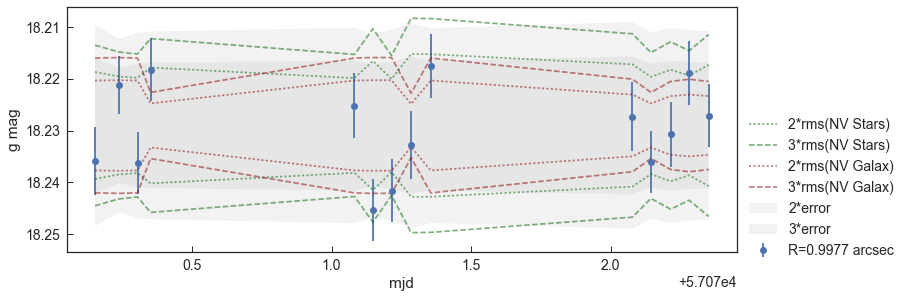

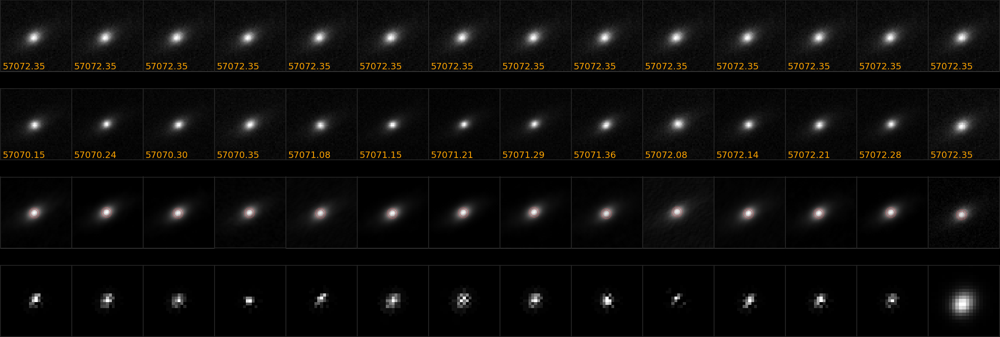

 ----------------------
Blind15A_37_N8_1508_3956
raMedian              154.749
decMedian           -0.182531
Amplitude           0.0139709
Std                 0.0084958
ExcessVariance    0.000326235
StdToErr              1.51999
Nout2sigma          0.0505991
Beyond1Std           0.357143
Mean                  19.6123
zsp                   0.09229
gmag                   17.332
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_37_N8_1508_3956, dtype: object
True

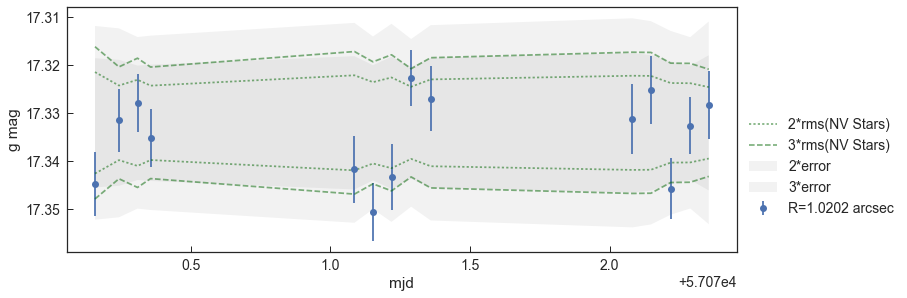

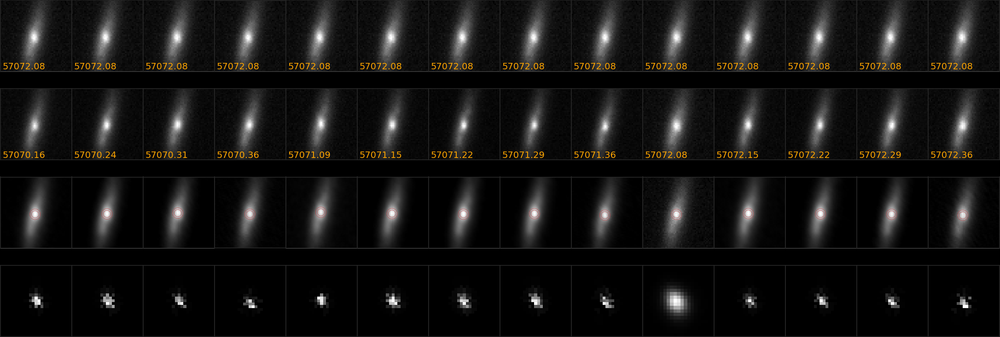

 ----------------------
Blind15A_44_S2_1885_1596
raMedian              157.354
decMedian           -0.116629
Amplitude            0.014099
Std                0.00826914
ExcessVariance    0.000250478
StdToErr              1.26744
Nout2sigma          0.0214443
Beyond1Std           0.428571
Mean                  20.2835
zsp                   0.11831
gmag                    18.44
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_44_S2_1885_1596, dtype: object
True

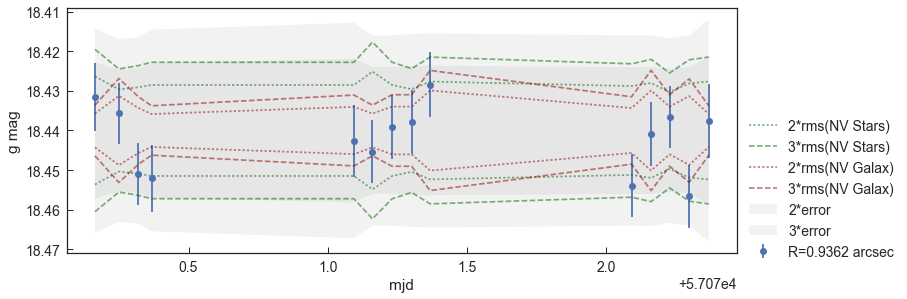

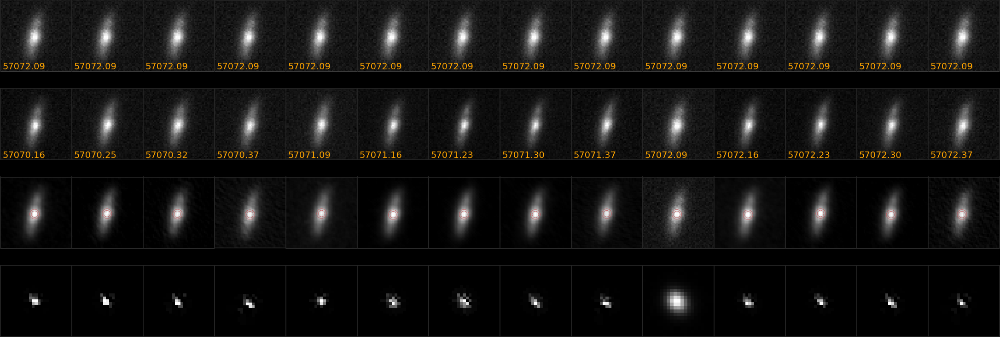

 ----------------------
Blind15A_37_S11_0155_0979
raMedian              155.465
decMedian            0.410082
Amplitude           0.0141205
Std                0.00807869
ExcessVariance    0.000382408
StdToErr               2.0513
Nout2sigma           0.171482
Beyond1Std           0.285714
Mean                  18.4455
zsp                   0.02134
gmag                   15.717
spType                 GALAXY
spCl                   GALAXY
subClass                  AGN
GZ_morph                    S
Name: Blind15A_37_S11_0155_0979, dtype: object
True

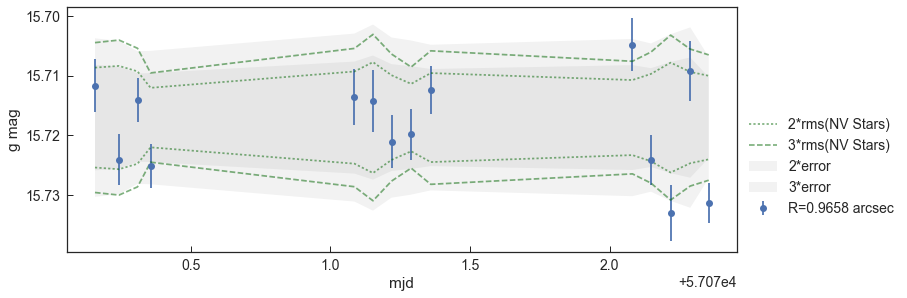

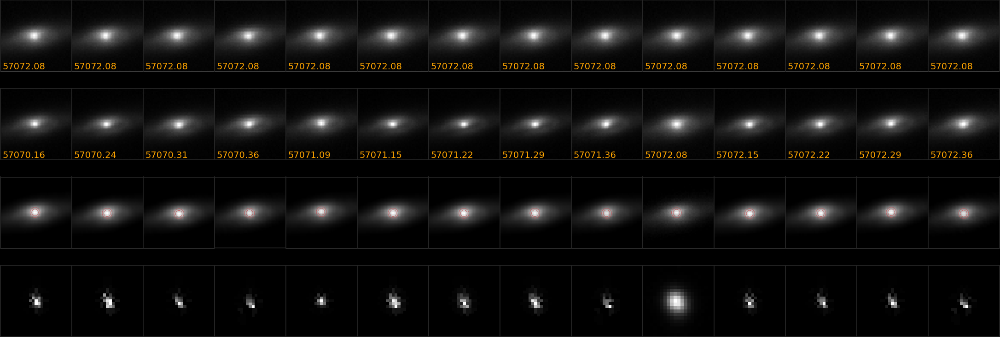

 ----------------------
Blind15A_16_S16_1892_3324
raMedian              145.246
decMedian             2.05342
Amplitude           0.0142442
Std                0.00949234
ExcessVariance    0.000248655
StdToErr              1.18639
Nout2sigma          0.0216267
Beyond1Std           0.307692
Mean                   20.541
zsp                   0.15239
gmag                   18.559
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_16_S16_1892_3324, dtype: object
True

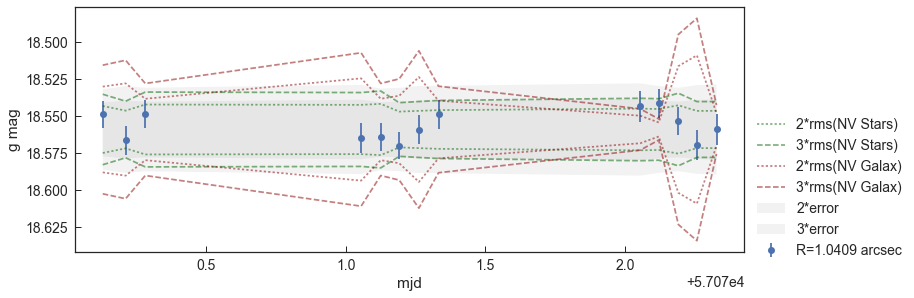

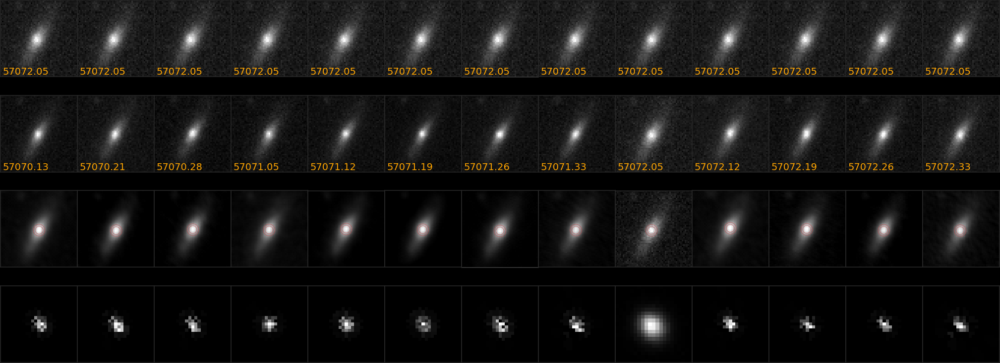

 ----------------------
Blind15A_37_S28_0930_3542
raMedian              155.963
decMedian            0.845284
Amplitude           0.0142583
Std                0.00815951
ExcessVariance    0.000369798
StdToErr              1.99797
Nout2sigma           0.124278
Beyond1Std           0.285714
Mean                  19.1022
zsp                   0.07125
gmag                   17.361
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_37_S28_0930_3542, dtype: object
True

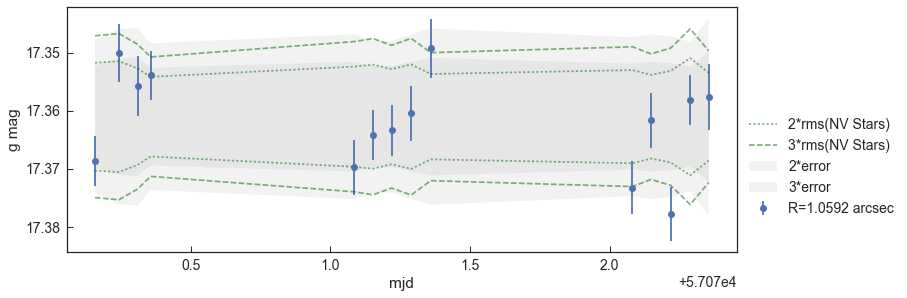

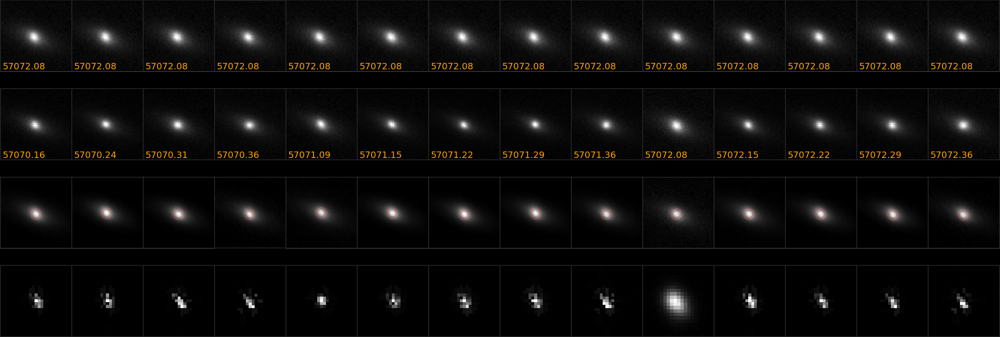

 ----------------------
Blind15A_25_N24_0453_2012
raMedian              148.237
decMedian             1.63104
Amplitude           0.0144345
Std                0.00976006
ExcessVariance    0.000374279
StdToErr               1.5748
Nout2sigma          0.0552698
Beyond1Std                0.5
Mean                  20.1448
zsp                   0.09662
gmag                   18.112
spType                     QA
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_25_N24_0453_2012, dtype: object
True

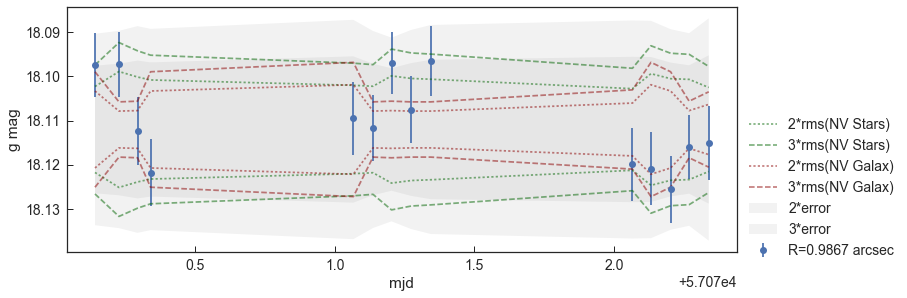

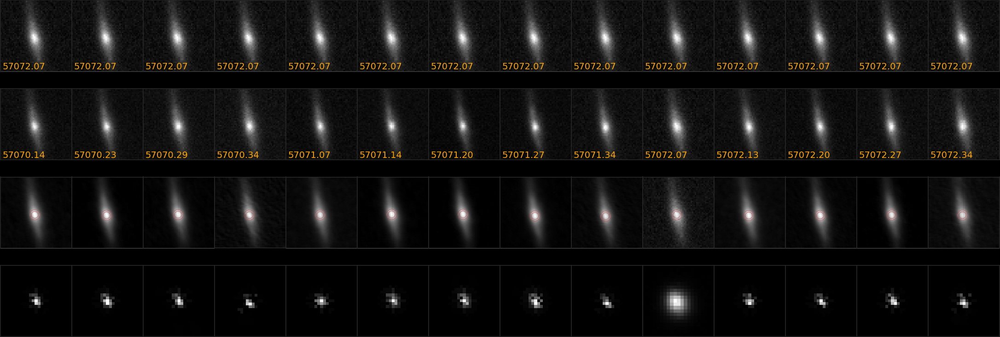

 ----------------------
Blind15A_34_S26_0114_0371
raMedian              152.841
decMedian            0.809994
Amplitude           0.0144885
Std                0.00846878
ExcessVariance    0.000296516
StdToErr              1.36794
Nout2sigma          0.0447862
Beyond1Std           0.307692
Mean                  19.4885
zsp                   0.12184
gmag                   18.011
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_34_S26_0114_0371, dtype: object
True

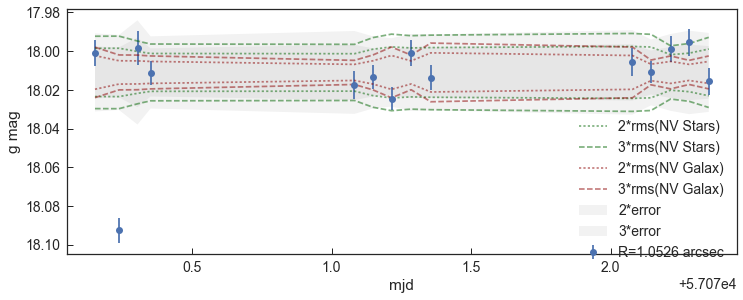

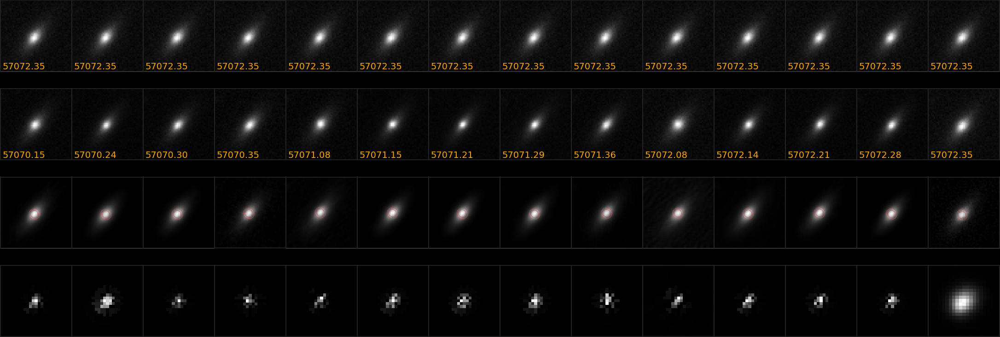

 ----------------------
Blind15A_36_S24_0307_3847
raMedian             155.449
decMedian            2.72636
Amplitude           0.014544
Std               0.00951658
ExcessVariance             0
StdToErr            0.242705
Nout2sigma        0.00232468
Beyond1Std          0.285714
Mean                 18.9264
zsp                    0.098
gmag                  16.792
spType                GALAXY
spCl                  GALAXY
subClass                 AGN
GZ_morph                   S
Name: Blind15A_36_S24_0307_3847, dtype: object
True

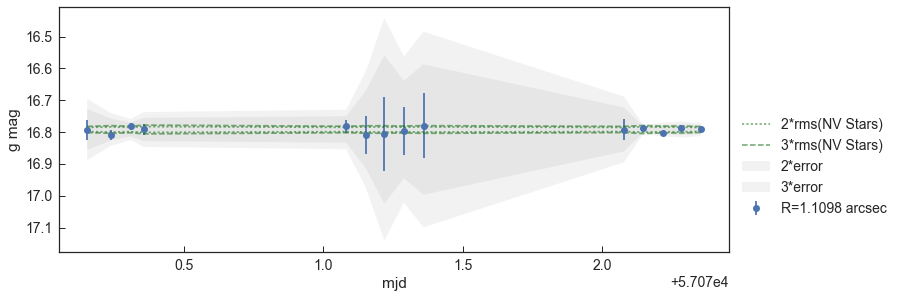

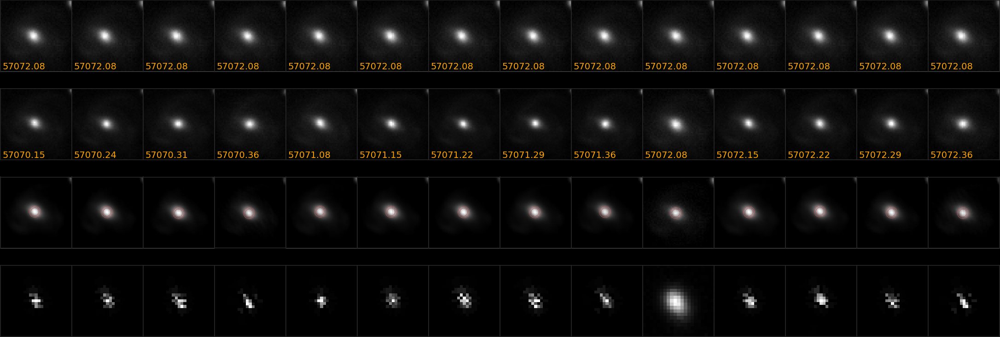

 ----------------------
Blind15A_36_S21_1643_0759
raMedian               154.29
decMedian             2.63078
Amplitude           0.0145504
Std                0.00889858
ExcessVariance    0.000346266
StdToErr              1.57422
Nout2sigma          0.0494747
Beyond1Std           0.357143
Mean                  19.8476
zsp                   0.10164
gmag                   17.274
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_36_S21_1643_0759, dtype: object
True

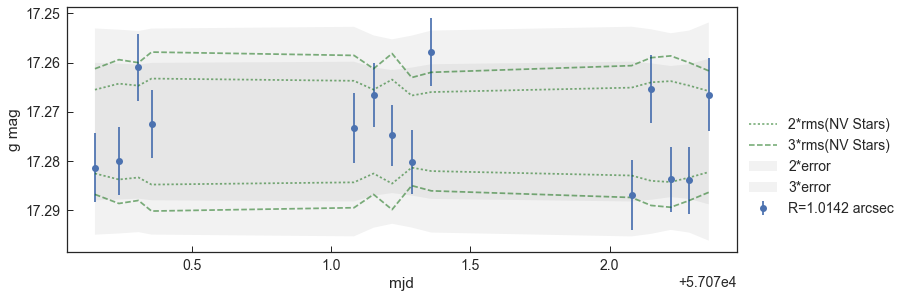

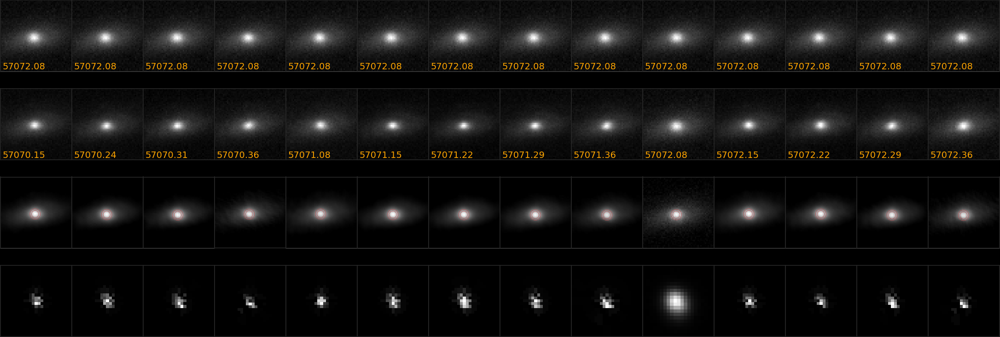

 ----------------------
Blind15A_37_S11_0468_2518
raMedian              155.578
decMedian            0.387023
Amplitude           0.0145704
Std                0.00841492
ExcessVariance    0.000343119
StdToErr              1.66235
Nout2sigma          0.0738258
Beyond1Std           0.285714
Mean                  19.5912
zsp                   0.09406
gmag                   18.324
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_37_S11_0468_2518, dtype: object
True

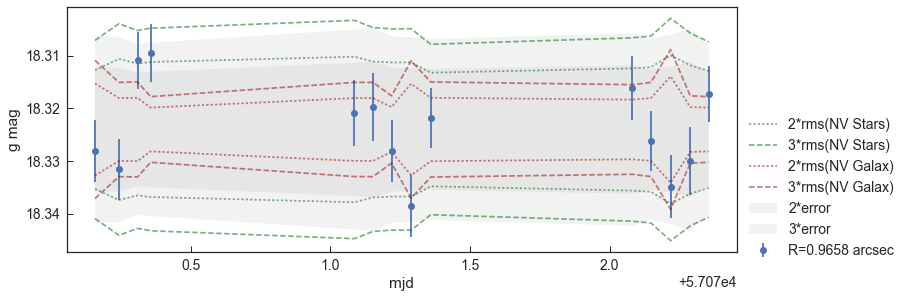

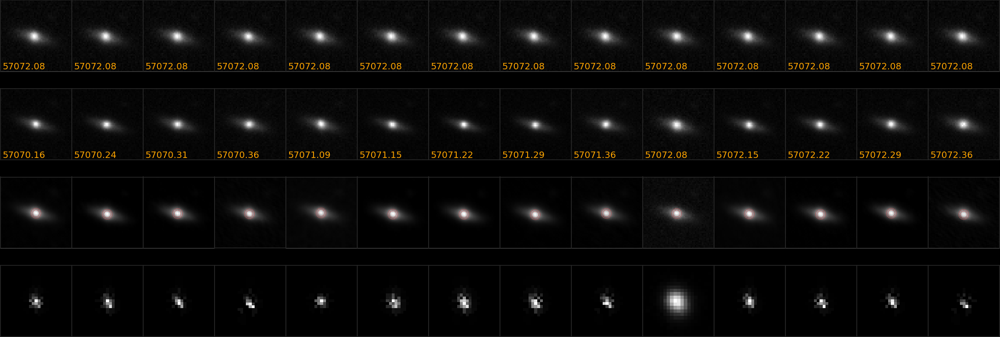

 ----------------------
Blind15A_47_S18_1210_3693
raMedian              160.965
decMedian            0.401607
Amplitude           0.0146608
Std                0.00761058
ExcessVariance    0.000181153
StdToErr              1.14088
Nout2sigma         0.00806594
Beyond1Std                0.4
Mean                  20.2234
zsp                   0.09915
gmag                   17.611
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_47_S18_1210_3693, dtype: object
True

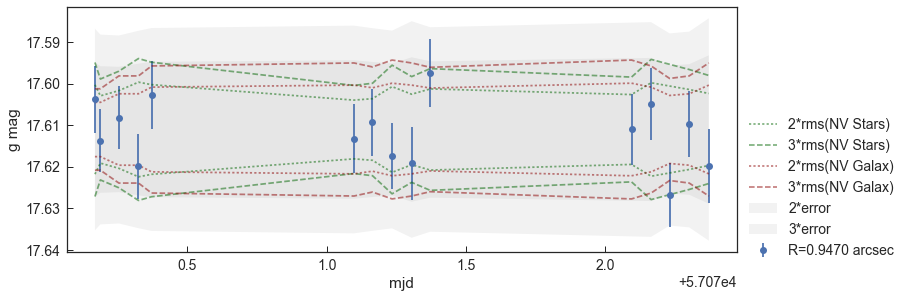

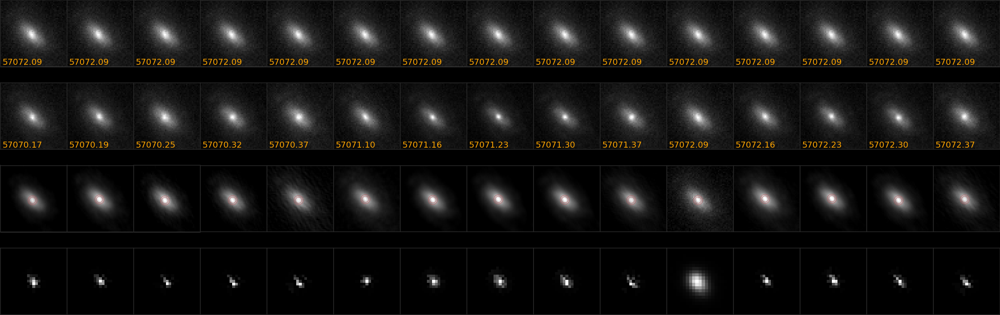

 ----------------------
Blind15A_36_S1_0804_2697
raMedian               153.81
decMedian             2.19821
Amplitude           0.0146717
Std                0.00773063
ExcessVariance    0.000296508
StdToErr              1.52587
Nout2sigma          0.0432944
Beyond1Std           0.285714
Mean                  19.6927
zsp                   0.07184
gmag                   17.875
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_36_S1_0804_2697, dtype: object
True

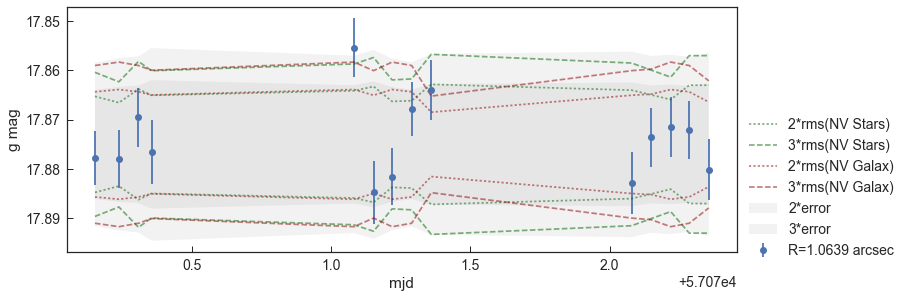

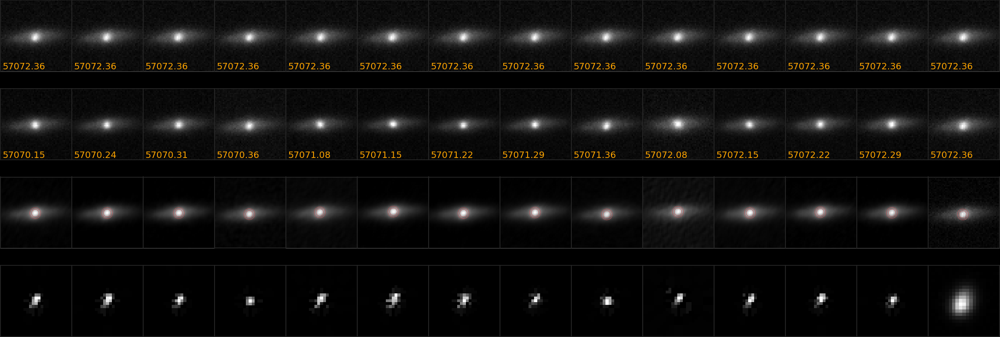

 ----------------------
Blind15A_45_N16_0466_3189
raMedian              156.781
decMedian             1.49301
Amplitude            0.014888
Std                0.00851285
ExcessVariance    0.000301797
StdToErr              1.37994
Nout2sigma          0.0218552
Beyond1Std           0.466667
Mean                  19.4375
zsp                   0.03276
gmag                   14.588
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_45_N16_0466_3189, dtype: object
True

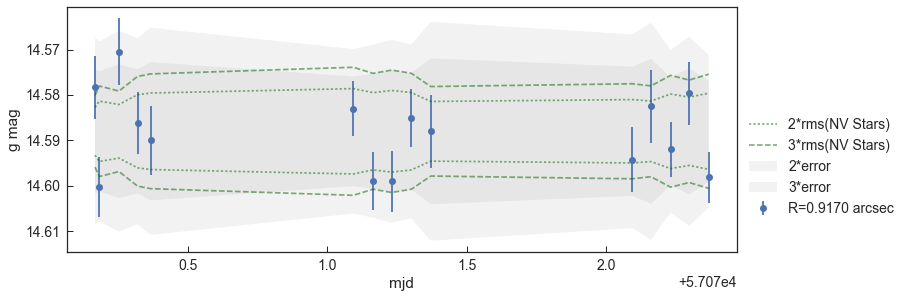

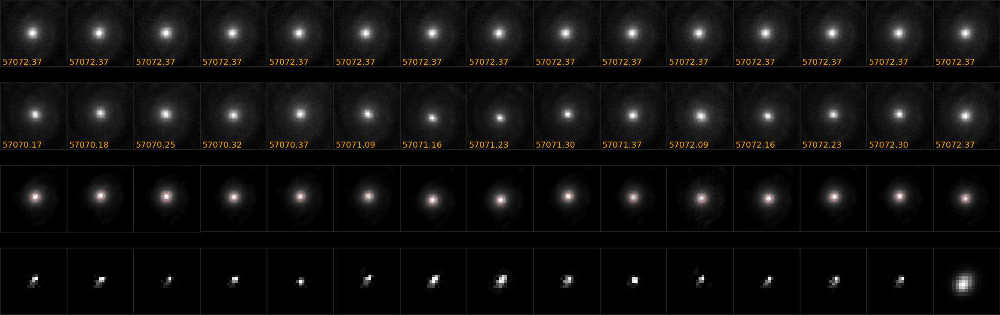

 ----------------------
Blind15A_47_S23_0719_3858
raMedian              160.822
decMedian            0.602107
Amplitude           0.0149509
Std                0.00886177
ExcessVariance    0.000340221
StdToErr              1.52262
Nout2sigma          0.0307342
Beyond1Std           0.333333
Mean                  19.6421
zsp                   0.09466
gmag                     17.1
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_47_S23_0719_3858, dtype: object
True

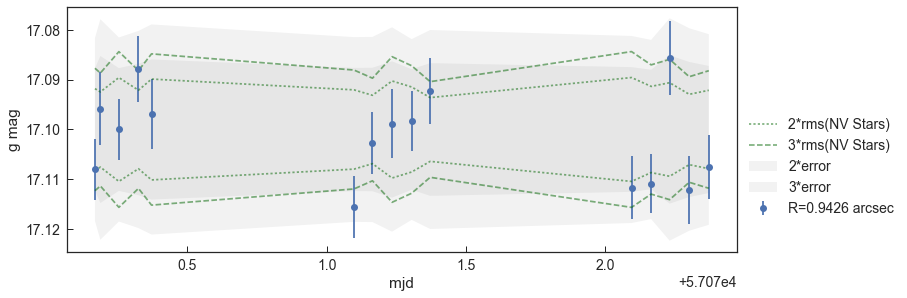

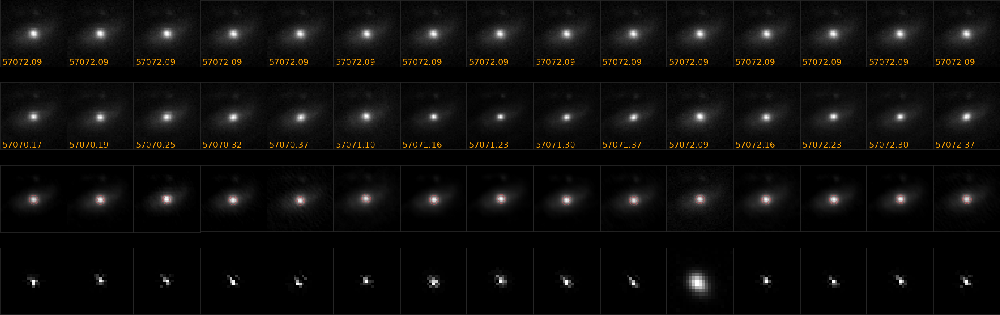

 ----------------------
Blind15A_47_N20_0244_1528
raMedian              159.718
decMedian           -0.513522
Amplitude           0.0150177
Std                0.00873544
ExcessVariance    0.000311531
StdToErr              1.43178
Nout2sigma          0.0383834
Beyond1Std           0.357143
Mean                  20.0678
zsp                   0.13392
gmag                   18.183
spType                 GALAXY
spCl                   GALAXY
subClass                  AGN
GZ_morph                    S
Name: Blind15A_47_N20_0244_1528, dtype: object
True

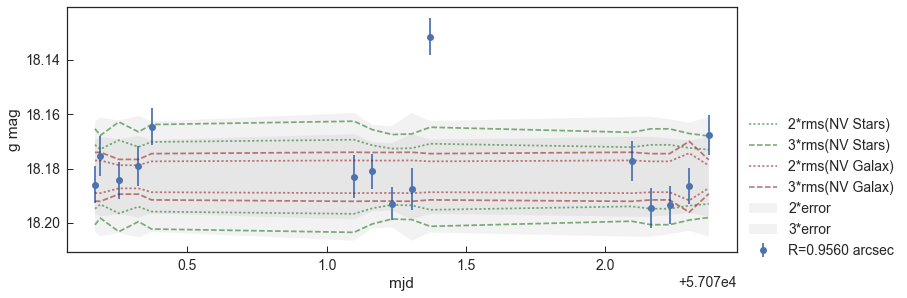

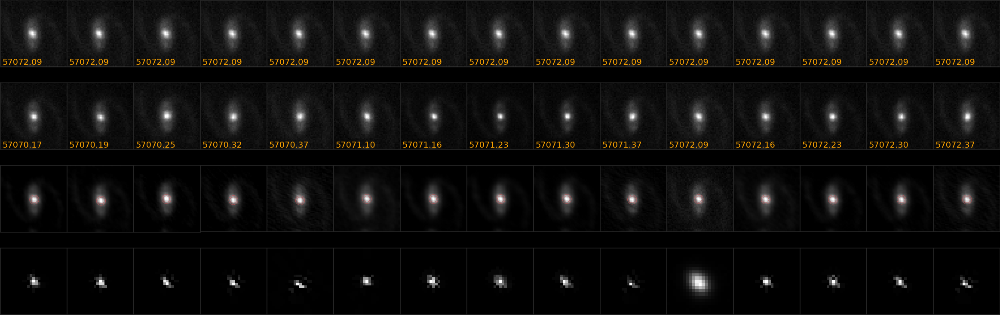

 ----------------------
Blind15A_06_S12_1837_3418
raMedian              141.255
decMedian             1.89049
Amplitude           0.0150374
Std                0.00862371
ExcessVariance    0.000331936
StdToErr               1.5534
Nout2sigma          0.0683049
Beyond1Std           0.230769
Mean                  19.8809
zsp                   0.06972
gmag                   17.017
spType                     QA
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_06_S12_1837_3418, dtype: object
True

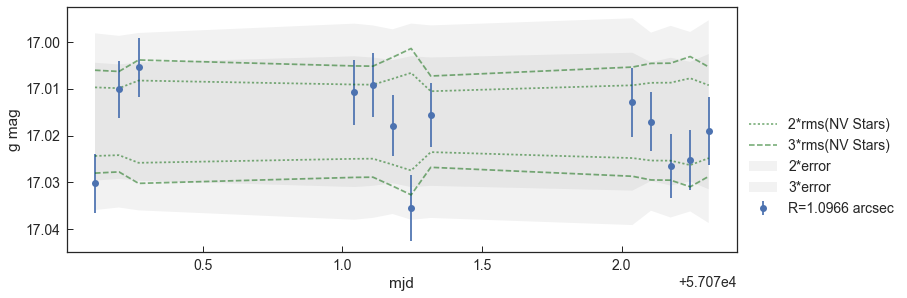

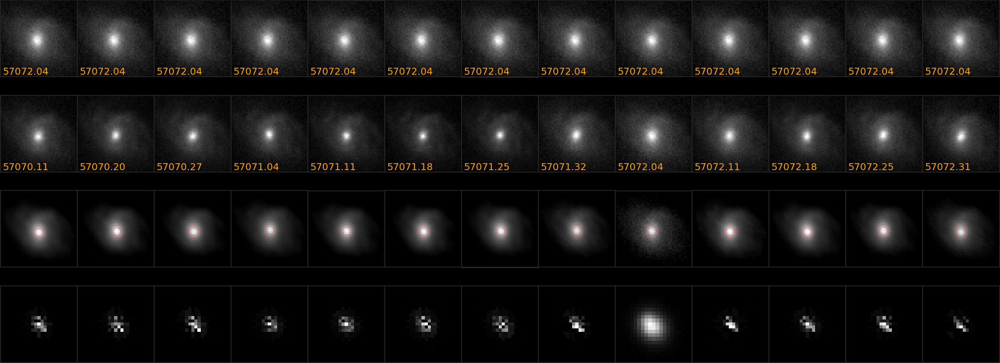

 ----------------------
Blind15A_27_N13_1940_1684
raMedian              150.448
decMedian           -0.161315
Amplitude           0.0151205
Std                0.00931999
ExcessVariance              0
StdToErr             0.240197
Nout2sigma        1.38703e-05
Beyond1Std           0.428571
Mean                  19.8225
zsp                   0.06506
gmag                   18.091
spType                 GALAXY
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_27_N13_1940_1684, dtype: object
True

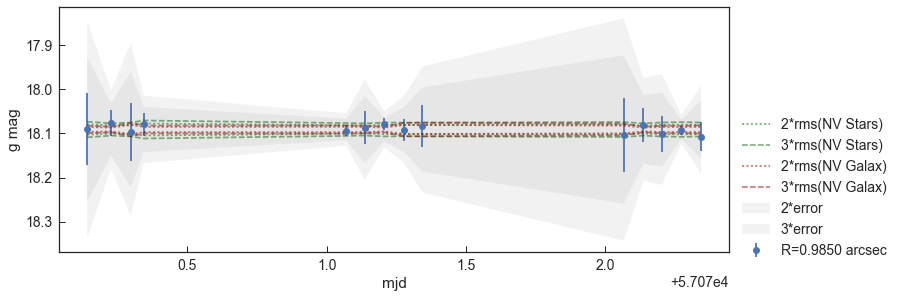

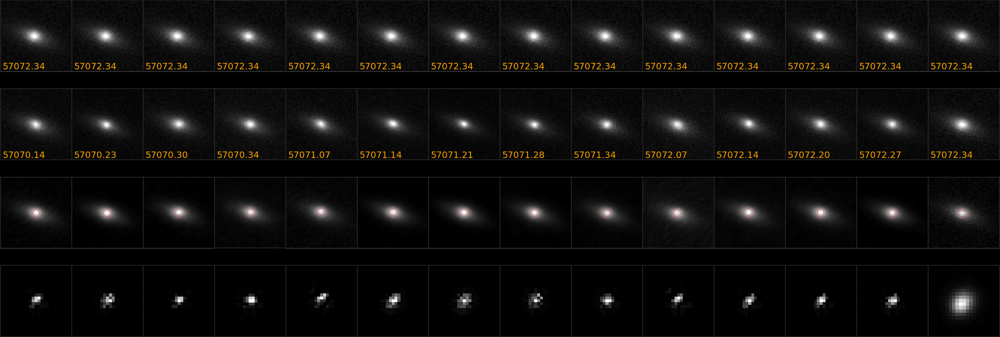

 ----------------------
Blind15A_16_S17_0077_3836
raMedian              145.595
decMedian             2.18563
Amplitude           0.0151225
Std                0.00983126
ExcessVariance    0.000460632
StdToErr              2.06037
Nout2sigma           0.255437
Beyond1Std           0.384615
Mean                  18.6606
zsp                      0.06
gmag                   16.895
spType                     QA
spCl                   GALAXY
subClass          STARFORMING
GZ_morph                    S
Name: Blind15A_16_S17_0077_3836, dtype: object
True

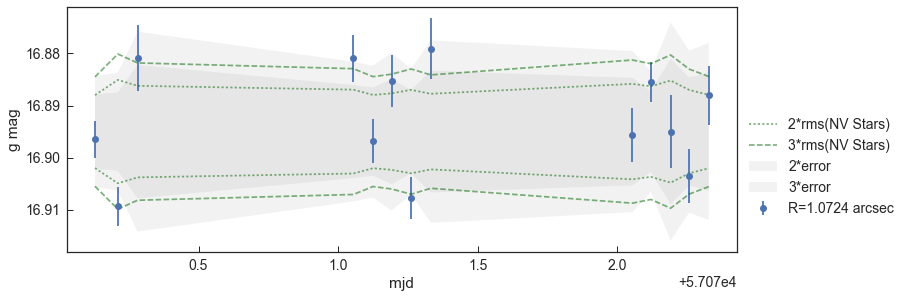

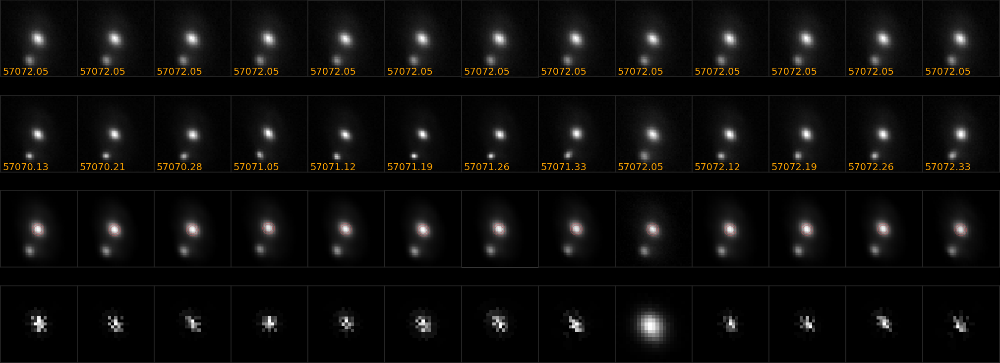

 ----------------------
Blind15A_37_N25_1635_3596
raMedian              155.034
decMedian            -0.68508
Amplitude           0.0151484
Std                0.00866285
ExcessVariance    0.000312778
StdToErr              1.44183
Nout2sigma          0.0358697
Beyond1Std           0.357143
Mean                  19.9524
zsp                   0.09464
gmag                   17.744
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_37_N25_1635_3596, dtype: object
True

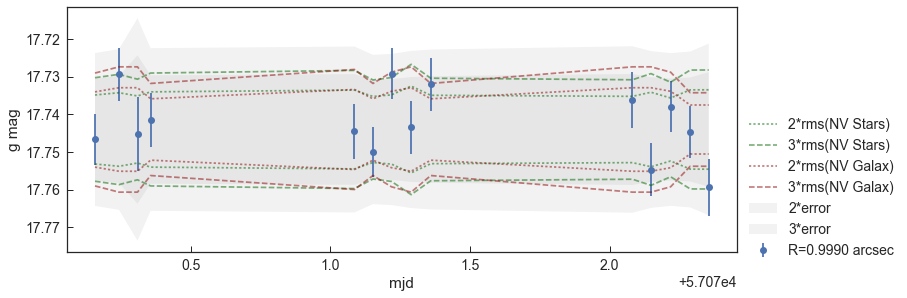

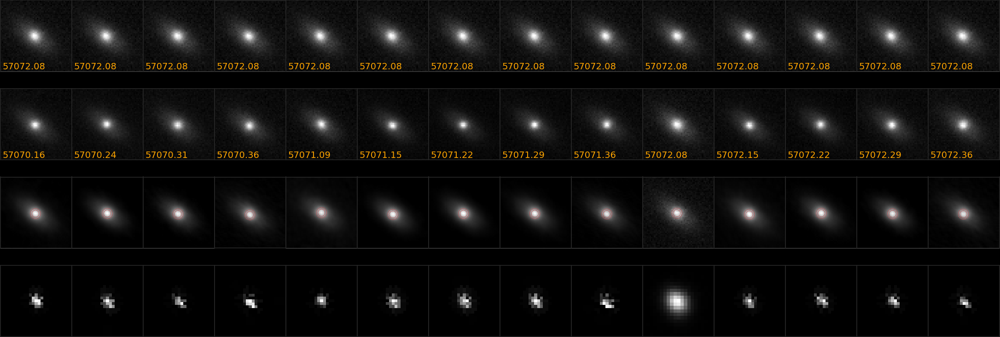

 ----------------------
Blind15A_45_S31_1004_4028
raMedian              157.311
decMedian             2.76896
Amplitude           0.0151631
Std                0.00952638
ExcessVariance    0.000479514
StdToErr              2.73573
Nout2sigma           0.331466
Beyond1Std           0.214286
Mean                  18.4919
zsp                   0.04156
gmag                   17.029
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_45_S31_1004_4028, dtype: object
True

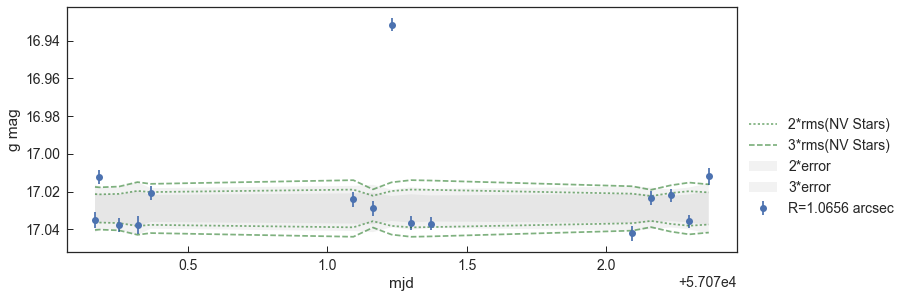

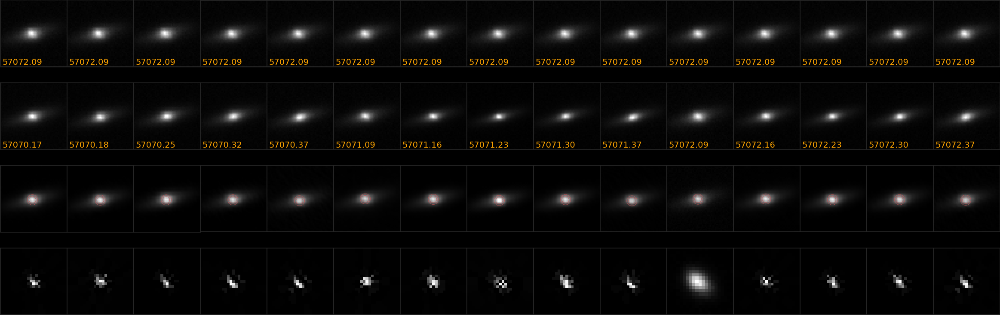

 ----------------------
Blind15A_44_N6_0955_1597
raMedian              158.598
decMedian           -0.214447
Amplitude           0.0151717
Std                0.00806724
ExcessVariance    0.000354744
StdToErr              1.92279
Nout2sigma           0.119636
Beyond1Std           0.142857
Mean                  19.4235
zsp                    0.0947
gmag                   17.757
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_44_N6_0955_1597, dtype: object
True

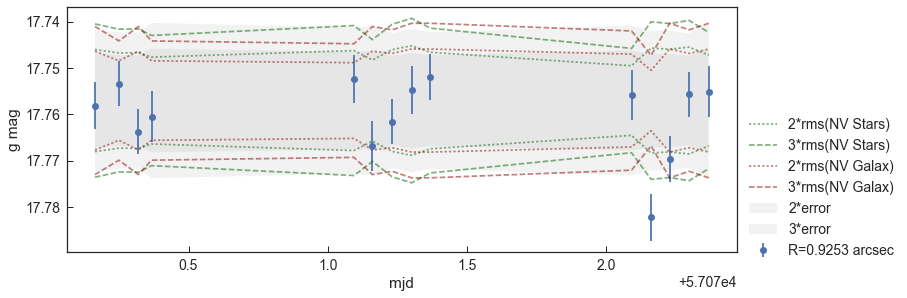

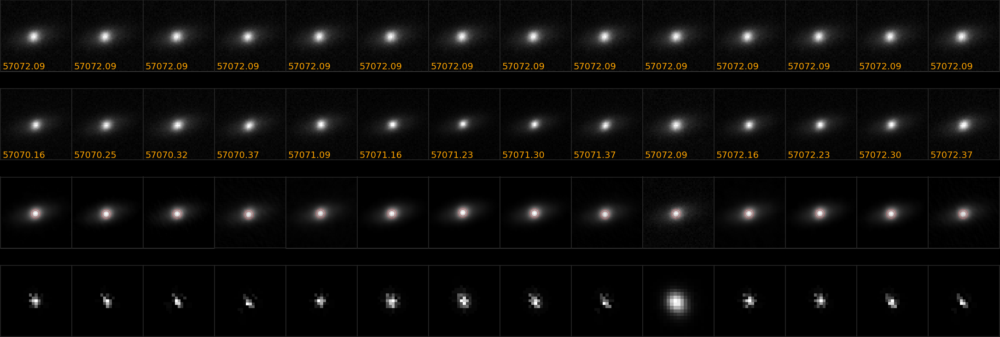

 ----------------------
Blind15A_46_S23_0573_1732
raMedian              159.453
decMedian             2.47208
Amplitude           0.0151969
Std                0.00901563
ExcessVariance    0.000313032
StdToErr              1.39907
Nout2sigma          0.0224065
Beyond1Std           0.333333
Mean                  20.1426
zsp                   0.11111
gmag                   18.684
spType                 GALAXY
spCl                   GALAXY
subClass                  AGN
GZ_morph                    S
Name: Blind15A_46_S23_0573_1732, dtype: object
True

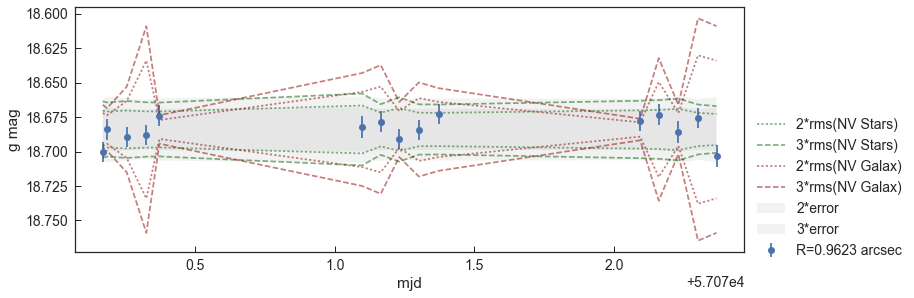

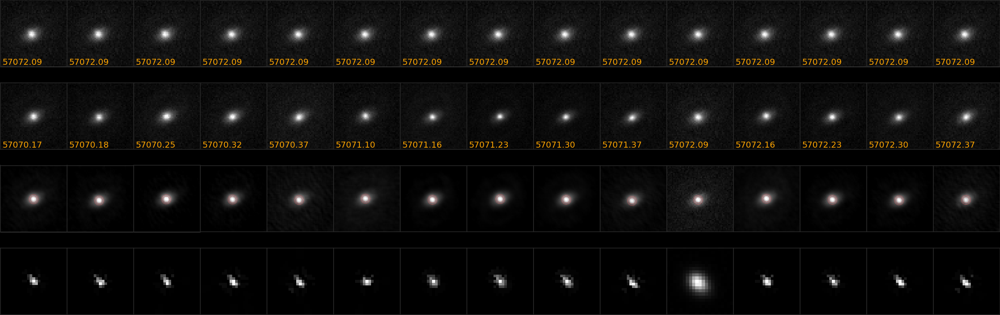

 ----------------------
Blind15A_37_S13_1477_0199
raMedian               156.03
decMedian             0.31236
Amplitude           0.0152543
Std                0.00968679
ExcessVariance    0.000416629
StdToErr              1.88594
Nout2sigma          0.0960891
Beyond1Std           0.357143
Mean                  19.7128
zsp                   0.09538
gmag                   18.159
spType                 GALAXY
spCl                   GALAXY
subClass                  NaN
GZ_morph                    S
Name: Blind15A_37_S13_1477_0199, dtype: object
True

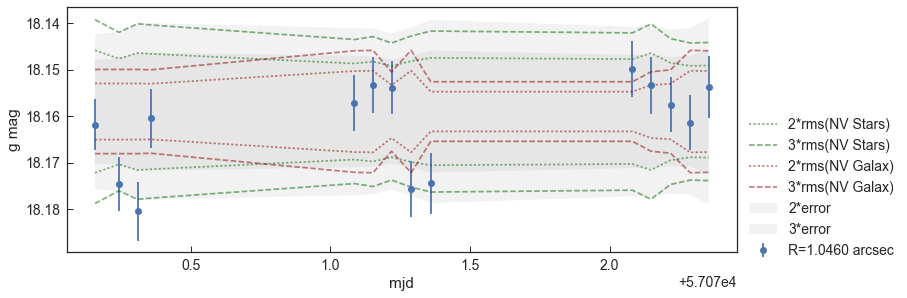

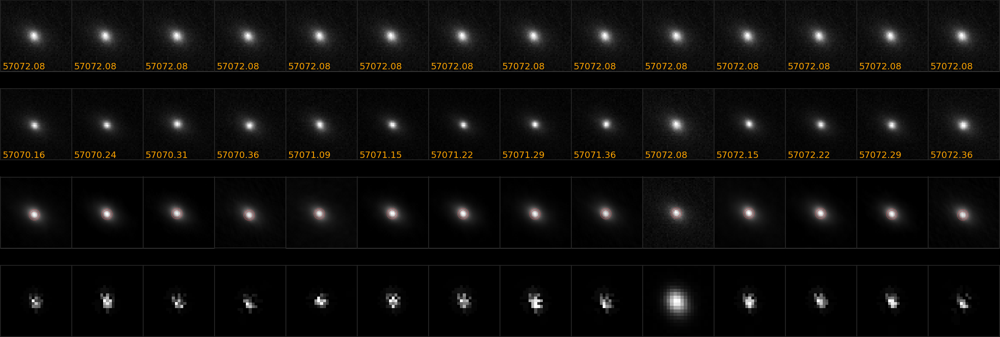

 ----------------------


In [38]:
# LC & stamps plots for the "variable" subset of galaxies.
# Need to check why some sources doesn't have stamp image.
# Colorsi in the lc represent different apertures radii.
# Dashed and pointed line represent +- 3 and 2 confidence 
# level from nonvariable stars at that bin of magnitude

# If text is printed in red, then that sources is in the IMBH papers

for idx, col in feat_tables.query('GZ_morph == "S"').sort_values('Amplitude',ascending=True).head(50).iterrows():
#for idx, col in feat_tables[0.75].query(
#    'ExcessVariance_cor == 0 and GZ_morph == "S"').sort_values(
#    'MedianErr',ascending=True).head(10).iterrows():
    #idx = col['internalID']
    if idx in id_x_IMBH_paper[ano]:
        print(Fore.RED + idx)
    else:
        print idx
    print col[['raMedian', 'decMedian', 'Amplitude', 'Std', 'ExcessVariance',
               'StdToErr', 'Nout2sigma', 'Beyond1Std', 'Mean',
               'zsp', 'gmag', 'spType', 'spCl', 'subClass', 'GZ_morph']]
    plots_lc(idx, cat=False, zp=col['gmag'])

    # yes/no/probable/no-idea/sustraction-fail
    #var = 'n'
    #var = str(raw_input('is it variable? [y/n/p/?/f] '))
    #high_var.loc[k, 'Variable'] = var
    #expert.append([idx, var])
    print '----------------------'
    #break

# Notes from LC visual inspection

Blind15A_36_N26_1094_1566 shows a peculiar x shape on the images, may be a foreground galaxy or grav lens.

# Playing with the data =D

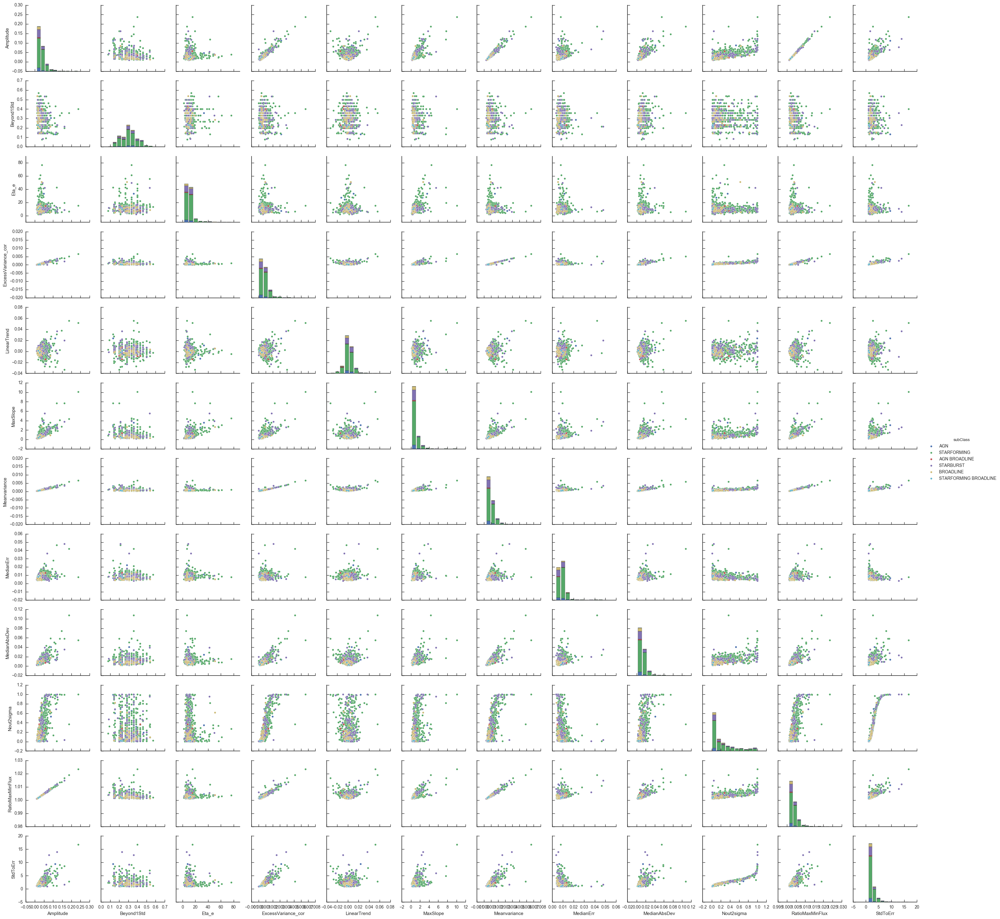

In [228]:
to_pair_plot = ['Amplitude', 'Beyond1Std', 'Eta_e',
                'ExcessVariance_cor', 'LinearTrend',
                'MaxSlope', 'Meanvariance', 'MedianErr',
                'MedianAbsDev', 'Nout2sigma',
                'RatioMaxMinFlux', 'StdToErr']
sb.pairplot(clean_feat_table[0.75], vars=to_pair_plot, hue='subClass')
plt.show()